In [1]:
import pytensor.tensor as pt
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pymc.sampling_jax
import seaborn as sns
from scipy.stats import pearsonr
from sklearn.preprocessing import MaxAbsScaler
import xarray as xr

plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100

%load_ext rich
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Read the data 

In [2]:
sales_df = pd.read_csv('Input_data/Sales_data_FY21-23.csv')
sales_df['Sales_Date'] = pd.to_datetime(sales_df['Sales_Date'])

market_df = pd.read_csv('Input_data/Market_Budget_data.csv')
market_df['Sales_Date'] = pd.to_datetime(market_df['Sales_Date'])

In [3]:
sales_df.drop(['SKU', 'Org_ID', 'Store', 'Country'], axis=1, inplace=True)

In [ ]:
sales_df = sales_df.groupby(['Sales_Date', 'Outlet_ID', 'Super_Division', 'City']).sum().reset_index()

sales_df

In [5]:
sales_df['Country'] = 'Deutschland'

In [6]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 689327 entries, 0 to 689326
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Sales_Date           689327 non-null  datetime64[ns]
 1   Outlet_ID            689327 non-null  object        
 2   Super_Division       689327 non-null  object        
 3   City                 689327 non-null  object        
 4   Rslr Sales Amount    689327 non-null  float64       
 5   Rslr Sales Quantity  689327 non-null  int64         
 6   Country              689327 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(4)
memory usage: 36.8+ MB


In [ ]:

market_df

In [8]:
market_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47616 entries, 0 to 47615
Data columns (total 10 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   Sales_Date                              47616 non-null  datetime64[ns]
 1   Broadcast Product Placement             47616 non-null  float64       
 2   Digital Display Advertising             47616 non-null  float64       
 3   POS - Visual Merchandise                47616 non-null  float64       
 4   Print Out of Home (OOH)                 47616 non-null  float64       
 5   Print Catalog                           47616 non-null  float64       
 6   Print Single page- Dual Page- Fold Out  47616 non-null  float64       
 7   Outlet_ID                               47616 non-null  object        
 8   City                                    47616 non-null  object        
 9   LOB                                     47616 non-

In [9]:
stores_list = market_df['Outlet_ID'].unique().tolist()

print('Number of stores where the marketing Budget allocated in Germany:', len(stores_list))

Number of stores where the marketing Budget allocated in Germany: 91


In [10]:
sales_df = sales_df.loc[sales_df['Outlet_ID'].isin(stores_list)].reset_index(drop=True)

In [11]:
len(sales_df['Outlet_ID'].unique().tolist())

90

In [12]:
diff_stores = list(set(stores_list)-set(sales_df['Outlet_ID'].unique().tolist()))

print('Stores outlet_Id that are not present in the sales_df:', diff_stores)

Stores outlet_Id that are not present in the sales_df: ['S035']


#### Data Preprocessing 

In [13]:
def get_market_budget_store(store_data):

    #store_data = data.loc[data['Outlet_ID']==store].reset_index(drop=True)
    #store_data = store_data.loc[store_data['LOB'] == 'Surface'].reset_index(drop=True)
    store_data['Activity_Tactic'] = store_data['Activity_Tactic'].str.replace(',' , '-')
    store_data['Activity_Tactic'] = store_data['Activity_Tactic'].str.rstrip()
    store_data = store_data.pivot_table(index=['Country', 'Status', 'LOB', 'Start-Date', 'End-Date', 'Quarter', 'Outlet_ID', 'City'], columns=['Activity_Tactic'], values='Amount_spent', aggfunc=np.sum, fill_value=0).reset_index()

    # Calculate the difference between the two dates
    store_data["num_steps"] = (store_data["End-Date"] - store_data["Start-Date"]).dt.days

    # Create a new DataFrame to store the sequential data
    sequential_data = pd.DataFrame()

    # Iterate over each row in the original DataFrame
    for index, row in store_data.iterrows():
        num_steps = row["num_steps"]
        
        # Create a sequence of datetime objects between the start and end date
        date_sequence = pd.date_range(start=row["Start-Date"], end=row["End-Date"], periods=num_steps)

        # Create a DataFrame for this sequence
        seq_df = pd.DataFrame()
        seq_df["Sales_Date"] = date_sequence.date
        seq_df["Sales_Date"] = pd.to_datetime(seq_df["Sales_Date"])

        # Interpolate numerical_column values and fill categorical_column values
        seq_df["Broadcast Product Placement"] = (row["Broadcast Product Placement"])/num_steps
        seq_df["Digital Display Advertising"] =  (row["Digital Display Advertising"])/num_steps
        seq_df["POS - Visual Merchandise"] =  (row["POS - Visual Merchandise"])/num_steps
        seq_df["Print Out of Home (OOH)"] =  (row["Print Out of Home (OOH)"])/num_steps
        seq_df["Print Catalog"] = (row["Print Catalog"])/num_steps
        seq_df['Print Single page- Dual Page- Fold Out'] = (row['Print Single page- Dual Page- Fold Out'])/num_steps
        seq_df["Outlet_ID"] = row['Outlet_ID']
        seq_df['City'] = row['City']
        seq_df['LOB'] = row['LOB']

        # Append the sequence DataFrame to the sequential_data DataFrame
        sequential_data = pd.concat([sequential_data, seq_df], ignore_index=True)

    # Drop the temporary 'num_steps' column from the original DataFrame
    #sequential_data.drop(columns="num_steps", inplace=True)
    
    return sequential_data, store_data

    



In [ ]:
print('Budget for the channel Digital Display Advertising :', market_df['Digital Display Advertising'].sum(),'\n',
      'Budget for the channel POS - Visual Merchandise :', market_df['POS - Visual Merchandise'].sum(),'\n',
      'Budget for the channel Print Single page- Dual Page- Fold Out :', market_df['Print Single page- Dual Page- Fold Out'].sum(),'\n',
      'Budget for the channel Broadcast Product Placement :', market_df['Broadcast Product Placement'].sum(),'\n',
      'Budget for the channel Print Out of Home (OOH) :', market_df['Print Out of Home (OOH)'].sum(), '\n',
      'Budget for the channel Print Catalog :', market_df['Print Catalog'].sum())

In [17]:
sales_df['Super_Division'].replace({'EDG Managed - Surface Devices' : 'Surface',
                                    'EDG Managed - Office License and HP' : 'Office',
                                    'EDG Managed - Gaming Hardware' : 'Xbox'}, inplace=True)

sales_df.rename(columns={'Super_Division' : 'LOB'}, inplace=True)

In [18]:
sales_df['LOB'].unique().tolist()

['Xbox', 'Office', 'Surface']

In [19]:
sales_df = sales_df.groupby(['Sales_Date', 'LOB']).sum().reset_index()[['Sales_Date', 'LOB', 'Rslr Sales Amount', 'Rslr Sales Quantity']]
market_df = market_df.groupby(['Sales_Date', 'LOB']).sum().reset_index()[['Sales_Date', 'LOB', 'Broadcast Product Placement', 'Digital Display Advertising', 'POS - Visual Merchandise', 
                                                        'Print Out of Home (OOH)', 'Print Single page- Dual Page- Fold Out']]

In [20]:
#### Convert into weekly sales data
sales_df = sales_df.set_index("Sales_Date").groupby(['LOB', pd.Grouper(freq='W-MON')])[["Rslr Sales Quantity", "Rslr Sales Amount"]].sum().astype(int).reset_index()

market_df = market_df.set_index("Sales_Date").groupby(['LOB', pd.Grouper(freq='W-MON')])[['Broadcast Product Placement', 'Digital Display Advertising', 'POS - Visual Merchandise', 
                                                        'Print Out of Home (OOH)', 'Print Single page- Dual Page- Fold Out']].sum().astype(int).reset_index()

In [21]:
# helper function to print messages
def cprint(title, *args):
    print(
        "="*len(title), title, "="*len(title),
        *args,
        sep="\n",
    )

In [22]:
num_store = sales_df.LOB.nunique()
train_start = sales_df.Sales_Date.min().date()
train_end = sales_df.Sales_Date.max().date()
Totaldatapoints = num_store * sales_df.Sales_Date.nunique()
Actualdatapoints = sales_df.shape[0]

cprint(
    "Basic information of data",
    f"Number of stores            : {num_store}",
    f"Number of target series     : {num_store}",
    "",
    f"Total Number of data points: {Totaldatapoints}",
    f"Actual number of data points: {Actualdatapoints}",
    f"Number of missing data points : {Totaldatapoints - Actualdatapoints}",
)

Basic information of data
Number of stores            : 3
Number of target series     : 3

Total Number of data points: 471
Actual number of data points: 471
Number of missing data points : 0


In [23]:
def get_missingdata(store_data):

    Alldatapoints = pd.DataFrame()
    Outlet_IDs = store_data['LOB'].unique().tolist()
    least_date = store_data['Sales_Date'].min()
    latest_date = store_data['Sales_Date'].max()

    for ID in Outlet_IDs:
        store_df = store_data.loc[store_data['LOB'] == ID].reset_index(drop=True)
        
        if store_df.shape[0] == 157 :
            Alldatapoints = pd.concat([Alldatapoints, store_df]).reset_index(drop=True)

        else :
            store_df = (store_df.set_index('Sales_Date').reindex(pd.date_range(least_date, latest_date, freq='W-MON')).rename_axis(['Sales_Date']).fillna(0).reset_index())
            store_df['LOB'] = ID
            Alldatapoints = pd.concat([Alldatapoints, store_df]).reset_index(drop=True)

    
    return Alldatapoints


In [ ]:
sales_df

In [ ]:

surface_sales = pd.merge(sales_df, market_df[['Sales_Date', 'LOB', 'Broadcast Product Placement', 'Digital Display Advertising', 'POS - Visual Merchandise', 
                                                        'Print Out of Home (OOH)', 'Print Single page- Dual Page- Fold Out']], on=['Sales_Date','LOB'], how='left').fillna(0)


surface_sales

In [28]:
surface_sales.columns

Index(['LOB', 'Sales_Date', 'Rslr Sales Quantity', 'Rslr Sales Amount',
       'Broadcast Product Placement', 'Digital Display Advertising',
       'POS - Visual Merchandise', 'Print Out of Home (OOH)',
       'Print Single page- Dual Page- Fold Out', 'black_week'],
      dtype='object')

In [26]:
surface_sales['black_week'] = np.where((surface_sales['Sales_Date'].dt.month == 11) & (surface_sales['Sales_Date'].dt.day > 23), 1, 0)

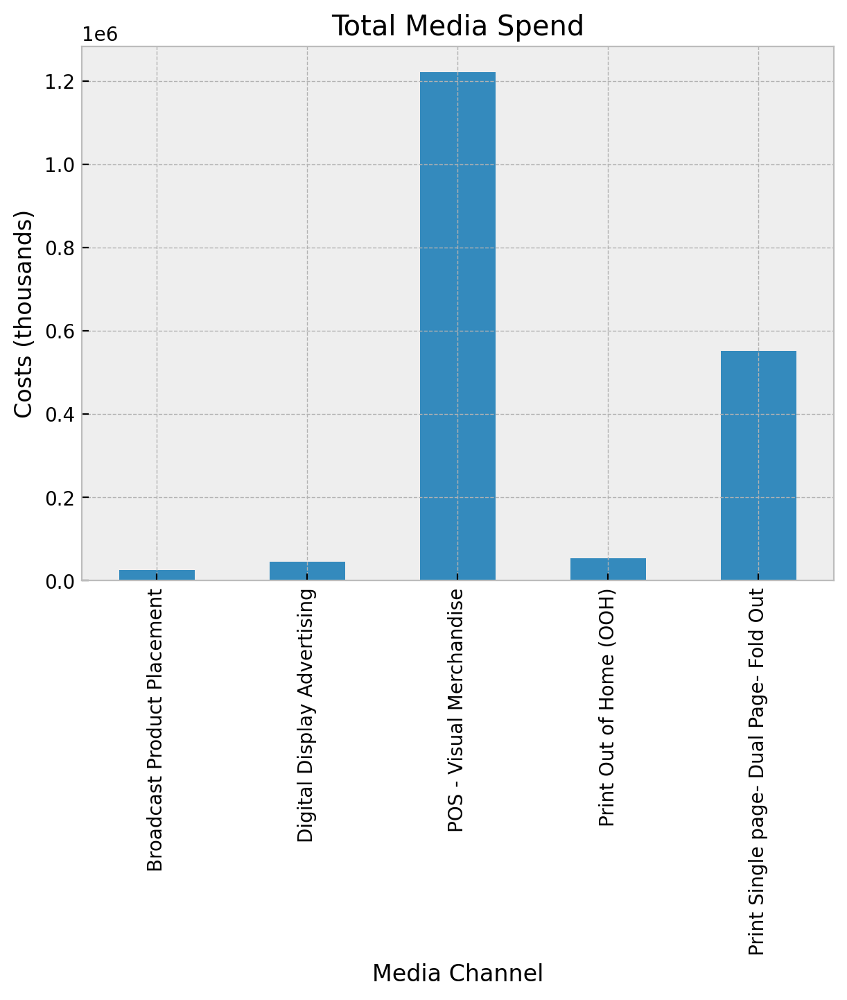

In [27]:
fig, ax = plt.subplots(figsize=(7, 5))
surface_sales[['Broadcast Product Placement', 'Digital Display Advertising',
       'POS - Visual Merchandise', 'Print Out of Home (OOH)',
       'Print Single page- Dual Page- Fold Out']].sum().plot(kind="bar", ax=ax)
ax.set(title="Total Media Spend", xlabel="Media Channel", ylabel="Costs (thousands)");

##### Control Variables 

In [33]:
lockdown1 = pd.date_range('2020-03-22', '2020-05-03', freq ='W-MON').to_list()
lockdown2 = pd.date_range('2020-12-13', '2021-03-07', freq ='W-MON').to_list()

lock_down = lockdown1+lockdown2
office_lockdown = ['2021-04-05', '2021-04-12', '2021-04-19', '2021-04-26', '2021-05-03', '2021-05-03', '2021-05-10', '2021-05-17', '2021-05-24']

surface_sales['Covid_effect'] = np.where(surface_sales['Sales_Date'].isin(lock_down), 1, 0)

surface_sales['Covid_effect'] = np.where((surface_sales['LOB'] == 'Office') & (surface_sales['Sales_Date'].isin(office_lockdown)), 1, surface_sales['Covid_effect'])

In [34]:
surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Office') & (surface_sales['Sales_Date'].dt.year == 2020) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 7) &
(surface_sales['Sales_Date'].dt.day <= 14), 1, 0)
surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Office') & (surface_sales['Sales_Date'].dt.year == 2021) & (surface_sales['Sales_Date'].dt.month == 3) & (surface_sales['Sales_Date'].dt.day > 8) & 
(surface_sales['Sales_Date'].dt.day <= 29), 1, surface_sales['special_event'])


surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Surface') & (surface_sales['Sales_Date'].dt.year == 2020) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 23) & 
(surface_sales['Sales_Date'].dt.day <= 30), 1, surface_sales['special_event'])


surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2020) & (surface_sales['Sales_Date'].dt.month == 11) & (surface_sales['Sales_Date'].dt.day >= 9) & 
(surface_sales['Sales_Date'].dt.day <= 16), 1, surface_sales['special_event'])

surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2021) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 13) & 
(surface_sales['Sales_Date'].dt.day <= 27), 1, surface_sales['special_event'])

surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2022) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 12) & 
(surface_sales['Sales_Date'].dt.day <= 26), 1, surface_sales['special_event'])

In [35]:
surface_sales['Covid_effect'] = surface_sales['Covid_effect'].astype(float)
surface_sales['black_week'] = surface_sales['black_week'].astype(float)

surface_sales['special_event'] = surface_sales['special_event'].astype(float)

#### Modeling 

##### 1. Feature Engineering

##### Trend
For the trend component we simply use a linear feature (which we scale between 0 and 1).

In [36]:
n = range(len(surface_sales['Sales_Date'].unique()))

In [37]:
date = surface_sales['Sales_Date'].unique().tolist()

In [38]:
def trend(store_data):
    t = (store_data.index - store_data.index.min()) / (store_data.index.max() - store_data.index.min())
    return t

def seasonality(store_data):
    n_order = 7
    periods = store_data["Sales_Date"].dt.dayofyear / 365.25
    fourier_features = pd.DataFrame(
        {
            f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
            for order in range(1, n_order + 1)
            for func in ("sin", "cos")
        }
    )

    return fourier_features



def geometric_adstock(x, alpha: float = 0.0, l_max: int = 12):
    """Geometric adstock transformation."""
    cycles = [
        pt.concatenate(
            [pt.zeros(i), x[: x.shape[0] - i]]
        )
        for i in range(l_max)
    ]
    x_cycle = pt.stack(cycles)
    w = pt.as_tensor_variable([pt.power(alpha, i) for i in range(l_max)])
    return pt.dot(w, x_cycle)


def logistic_saturation(x, lam: float = 0.5):
    """Logistic saturation transformation."""
    return (1 - pt.exp(-lam * x)) / (1 + pt.exp(-lam * x))



In [39]:
surface_sales['LOB'] = pd.Categorical(surface_sales['LOB'])

In [40]:
surface_sales.rename(columns={'Print Out of Home (OOH)' : 'PrintOut of Home'}, inplace=True)

Text(0.5, 0, 'Revenue in Euros')

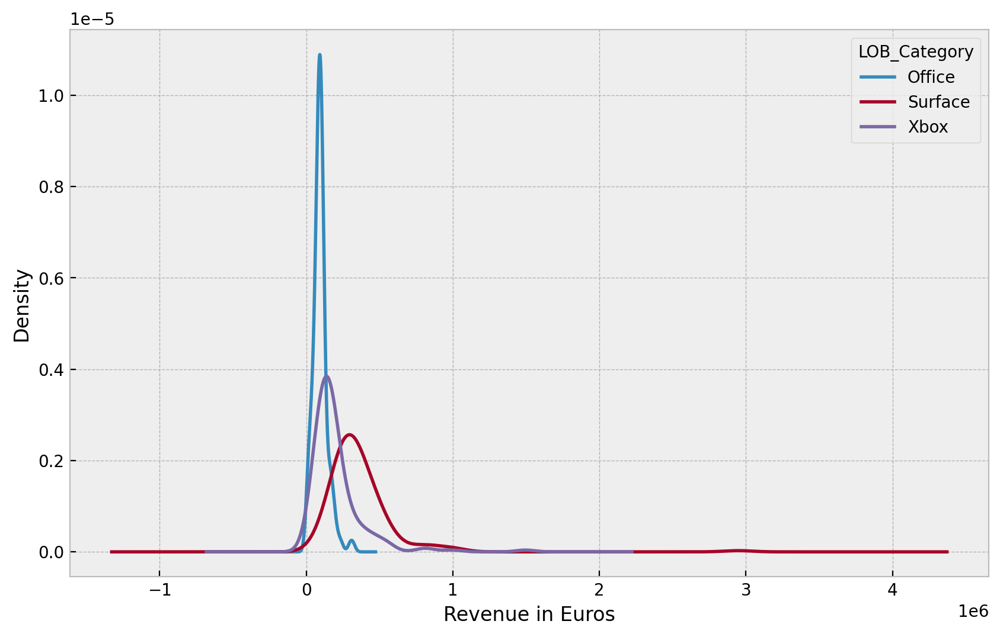

In [41]:
# Plot distribution of points by Students 
surface_sales.groupby(['LOB'])['Rslr Sales Amount'].plot(kind='kde')
# Add legend to plot
plt.legend(['Office', 'Surface', 'Xbox'], title='LOB_Category')

# Add x-axis label
plt.xlabel('Revenue in Euros') 

### Hierarchical Modelling

#### Scaling 

In [42]:
endog_scaler = MaxAbsScaler()
channel_scaler = MaxAbsScaler()

In [43]:
n_order = 7

coords = {"date": date, "fourier_mode": np.arange(2 * n_order)}

In [47]:
media_channles  = ['Broadcast Product Placement', 'Digital Display Advertising', 'POS - Visual Merchandise', 'PrintOut of Home', 'Print Single page- Dual Page- Fold Out']
control_variables = ['black_week', 'Covid_effect', 'special_event']

target = 'target_scaled'

In [45]:
endog_scaler.fit(surface_sales['Rslr Sales Amount'].to_numpy().reshape(-1, 1))
y_scaled = endog_scaler.transform(surface_sales['Rslr Sales Amount'].to_numpy().reshape(-1, 1)).flatten()

In [46]:
surface_sales['target_scaled'] = y_scaled

In [48]:
channel_scaler.fit(surface_sales[media_channles].to_numpy())
media_scaled = channel_scaler.transform(surface_sales[media_channles].to_numpy())

surface_sales[['Broadcast Product Placement_scaled', 'Digital Display Advertising_scaled', 'POS - Visual Merchandise_scaled', 'PrintOut of Home_scaled', 'Print Single page- Dual Page- Fold Out_scaled']] = media_scaled

In [50]:
required_columns = ['LOB', 'Sales_Date', 'black_week', 'Covid_effect','special_event', 'target_scaled', 'Broadcast Product Placement_scaled',
                    'Digital Display Advertising_scaled', 'POS - Visual Merchandise_scaled', 'PrintOut of Home_scaled', 'Print Single page- Dual Page- Fold Out_scaled']

In [52]:
scaledmedia_channles = ['Broadcast Product Placement_scaled', 'Digital Display Advertising_scaled', 'POS - Visual Merchandise_scaled', 'PrintOut of Home_scaled', 'Print Single page- Dual Page- Fold Out_scaled']

Text(0.5, 0, 'Revenue in Euros')

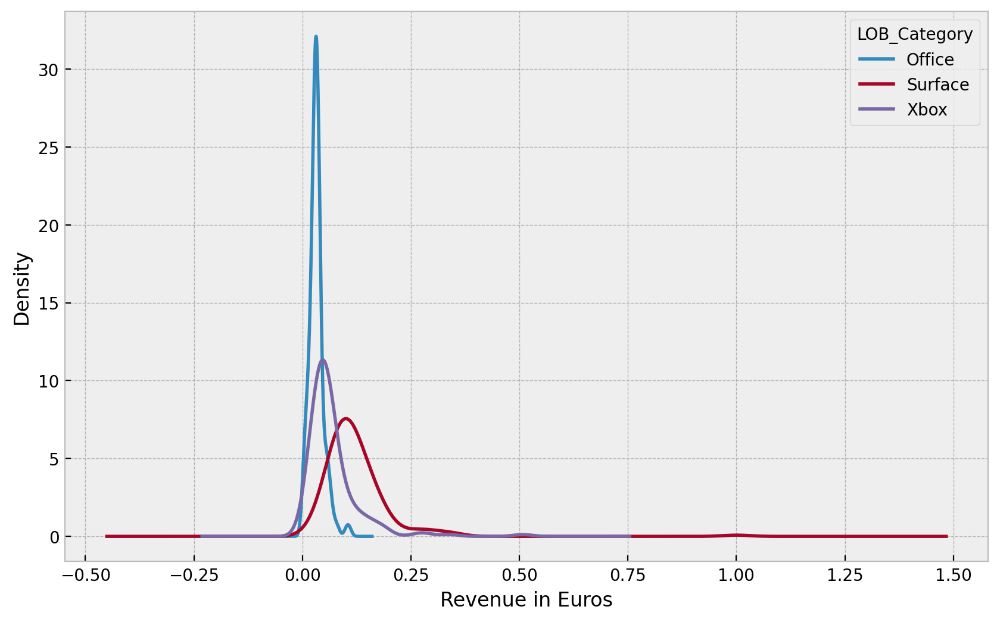

In [53]:
# Plot distribution of points by Students 
surface_sales.groupby(['LOB'])[target].plot(kind='kde')
# Add legend to plot
plt.legend(['Office', 'Surface', 'Xbox'], title='LOB_Category')

# Add x-axis label
plt.xlabel('Revenue in Euros') 

In [54]:
ss = surface_sales.loc[surface_sales['LOB'] == 'Office'].reset_index(drop=True)

In [55]:
n_order = 7
periods = ss["Sales_Date"].dt.dayofyear / 365.25
fourier_features = pd.DataFrame(
    {
        f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
        for order in range(1, n_order + 1)
        for func in ("sin", "cos")
    }
)

In [57]:
with pm.Model(coords=coords) as base_model:

    # --- coords ---
    base_model.add_coord(name="dat", values=date, mutable=True)
    base_model.add_coord(name="fourier_mode", values=np.arange(2 * n_order), mutable=False)


    for lob in surface_sales['LOB'].unique().tolist():

        lob_data = surface_sales.loc[surface_sales['LOB'] == lob].reset_index(drop=True)
        lob_data = lob_data[required_columns]
        date_index = lob_data.index
        y = lob_data[target].to_numpy()
        t = (lob_data.index - lob_data.index.min()) / (lob_data.index.max() - lob_data.index.min())
        t = t.values
        n_obs = y.size

        # --- priors ---
        ## intercept
        a = pm.Normal(name=f"a_{lob}", mu=0, sigma=4)
        ## trend
        b_trend = pm.Normal(name=f"b_trend_{lob}", mu=0, sigma=2)
        ## seasonality
        b_fourier = pm.Laplace(name=f"b_fourier_{lob}", mu=0, b=2, dims="fourier_mode")

        ## standard deviation of the normal likelihood
        sigma = pm.HalfNormal(name=f"sigma_{lob}", sigma=0.5)
        # degrees of freedom of the t distribution
        nu = pm.Gamma(name=f"nu_{lob}", alpha=15, beta=1)


        # --- channel contribution ---
        channel_contributions = []
        for channel in scaledmedia_channles:

            # --- data containers ---
            z_scaled_ = pm.MutableData(name=f"z_{lob}_{channel}", value=lob_data[channel].to_numpy(), dims="date")

            ## regressor
            b_z = pm.HalfNormal(name=f"b_{lob}_{channel}", sigma=2)

            channel_effect = pm.Deterministic(name=f"channel_effect_{lob}_{channel}", var=b_z * z_scaled_, dims="date")

            channel_contributions.append(channel_effect)


        # --- model parametrization ---
        trend = pm.Deterministic(name=f"trend_{lob}", var=a + b_trend * t, dims="date")
        seasonality = pm.Deterministic(
            name=f"seasonality_{lob}", var=pm.math.dot(fourier_features, b_fourier), dims="date"
        )

        # --- control variable ---i.e. special events
        covid_effect = pm.Normal(f"covid20_{lob}", mu = 0, sigma = 1)
        blackweek_effect = pm.Normal(f"Blackweekpromotion_{lob}", mu = 0, sigma = 1)

        covid_event = pm.Deterministic(name=f'Covid_imapct_{lob}', var = covid_effect*lob_data['Covid_effect'].to_numpy(), dims= 'date')
        blackweek_event = pm.Deterministic(name=f'Blackweek_imapct_{lob}', var = blackweek_effect*lob_data['black_week'].to_numpy(), dims='date')

        mu = pm.Deterministic(name=f"mu_{lob}", var=trend + seasonality + pm.math.sum(channel_contributions, axis=0) + blackweek_event + covid_event, dims="date")

        print(mu.shape)

        # --- likelihood ---
        pm.StudentT(name=f"likelihood_{lob}", nu=nu, sigma=sigma,  mu=mu, observed=y, dims="date")

    # --- prior samples ---
    base_model_prior_predictive = pm.sample_prior_predictive()





[157]
[157]
[157]


Sampling: [Blackweekpromotion_Office, Blackweekpromotion_Surface, Blackweekpromotion_Xbox, a_Office, a_Surface, a_Xbox, b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, b_fourier_Office, b_fourier_Surface, b_fourier_Xbox, b_trend_Office, b_trend_Surface, b_trend_Xbox, covid20_Office, covid20_Surface, covid20_Xbox, likelihood_Office, likelihood_Surface, likelihood_Xbox, nu_Office, nu_Su

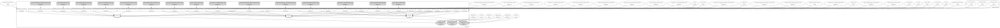

In [110]:
pm.model_to_graphviz(model=base_model)

#### Fit the model 

In [58]:
with base_model:
    base_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6_000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
    )
    base_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=base_model_trace
    )

c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\pymc\sampling\mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


Compilation time =  0:00:09.740280
Sampling...


Compiling.. :   0%|          | 0/7000 [00:00<?, ?it/s]








Running chain 0:   5%|▌         | 350/7000 [00:16<00:54, 121.83it/s]


Running chain 0:  10%|█         | 700/7000 [00:16<00:25, 244.12it/s]


Running chain 0:  15%|█▌        | 1050/7000 [00:16<00:15, 381.85it/s]

Running chain 0:  20%|██        | 1400/7000 [00:17<00:10, 524.13it/s]


Running chain 0:  25%|██▌       | 1750/7000 [00:17<00:07, 661.05it/s]


Running chain 0:  30%|███       | 2100/7000 [00:17<00:06, 787.70it/s]


Running chain 0:  35%|███▌      | 2450/7000 [00:17<00:05, 886.35it/s]


Running chain 0:  40%|████      | 2800/7000 [00:18<00:04, 984.27it/s]


Running chain 0:  45%|████▌     | 3150/7000 [00:18<00:03, 1016.00it/s]


Running chain 0:  50%|█████     | 3500/7000 [00:18<00:03, 1083.23it/s]


Running chain 0:  60%|██████    | 4200/7000 [00:19<00:02, 1123.56it/s]


Running chain 0:  65%|██████▌   | 4550/7000 [00:19<00:02, 1142.42it/s]


Running chain 0:  70%|███████   | 4900/7000 [00:20<00:01, 1185.23it/s]



Sampling time =  0:00:23.552734
Transforming variables...
Transformation time =  0:00:01.112251
Computing Log Likelihood...
Log Likelihood time =  0:00:02.943986


Sampling: [likelihood_Office, likelihood_Surface, likelihood_Xbox]


**Remark:** We add the argument idata_kwargs={"log_likelihood": True} since we want to compare various models using az.compare. See this issue for more details.

In [65]:
varables = []

for elem in ["a", "b_trend", "sigma", "nu"]:
    for lob in ['Office', 'Surface', 'Xbox']:
        var = elem+'_'+lob
        varables.append(var)

In [66]:
az.summary(
    data=base_model_trace,
    var_names=varables,
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_Office,0.048,0.002,0.045,0.051,0.000,0.000,23097.0,17976.0,1.0
a_Surface,0.127,0.005,0.117,0.137,0.000,0.000,11256.0,14214.0,1.0
a_Xbox,0.033,0.004,0.025,0.040,0.000,0.000,10310.0,14389.0,1.0
b_trend_Office,-0.028,0.003,-0.032,-0.023,0.000,0.000,19838.0,19154.0,1.0
b_trend_Surface,-0.034,0.008,-0.049,-0.018,0.000,0.000,11088.0,13961.0,1.0
b_trend_Xbox,0.051,0.006,0.039,0.063,0.000,0.000,11357.0,14407.0,1.0
sigma_Office,0.006,0.001,0.005,0.007,0.000,0.000,14343.0,16172.0,1.0
sigma_Surface,0.019,0.002,0.014,0.023,0.000,0.000,11583.0,15489.0,1.0
sigma_Xbox,0.015,0.002,0.011,0.018,0.000,0.000,8515.0,12891.0,1.0
nu_Office,7.358,1.945,4.039,11.051,0.015,0.011,15819.0,16758.0,1.0


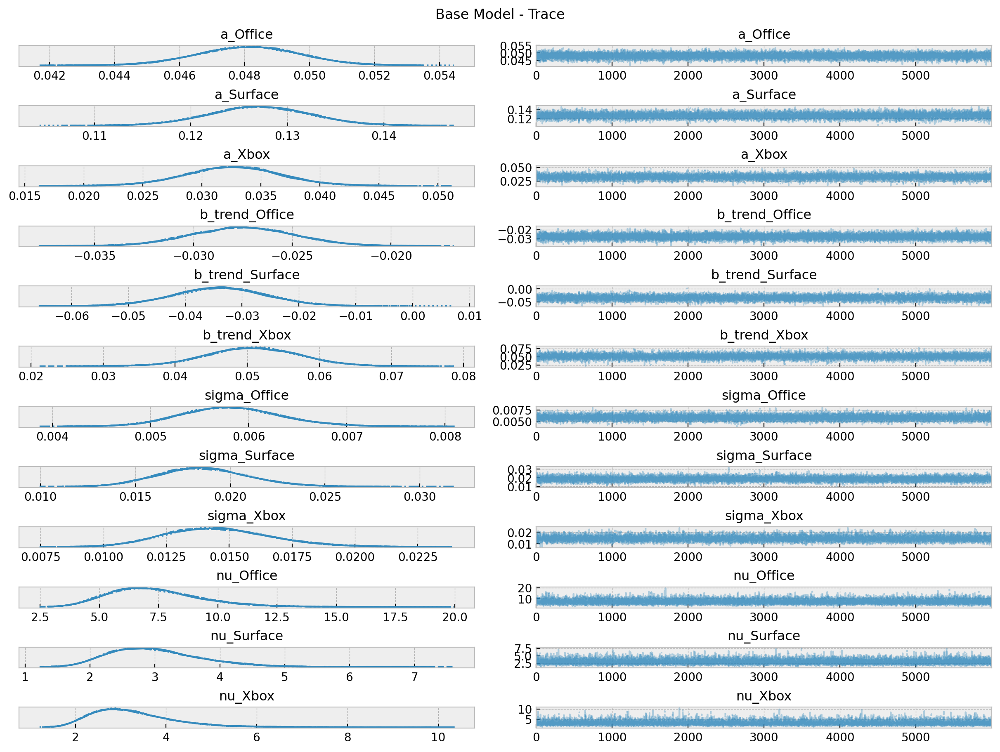

In [67]:
axes = az.plot_trace(
    data=base_model_trace,
    var_names=["a_Office", "a_Surface", 'a_Xbox',  "b_trend_Office", "b_trend_Surface", "b_trend_Xbox", "sigma_Office", 'sigma_Surface', 'sigma_Xbox', "nu_Office",
    "nu_Surface", "nu_Xbox"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Base Model - Trace");

In [68]:
posterior_predictive_likelihood = az.extract(
    data=base_model_posterior_predictive,
    group="posterior_predictive",
    var_names = ['likelihood_Office', 'likelihood_Surface', 'likelihood_Xbox'])


In [69]:
posterior_predictive_likelihood_inv_office = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood['likelihood_Office']
)

posterior_predictive_likelihood_inv_surface = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood['likelihood_Surface']
)

posterior_predictive_likelihood_inv_xox = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood['likelihood_Xbox']
)

In [71]:
###useful way to color the distribution
palette = "viridis_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))

In [82]:
LOBS = surface_sales['LOB'].unique().tolist()

In [83]:
LOBS

['Office', 'Surface', 'Xbox']

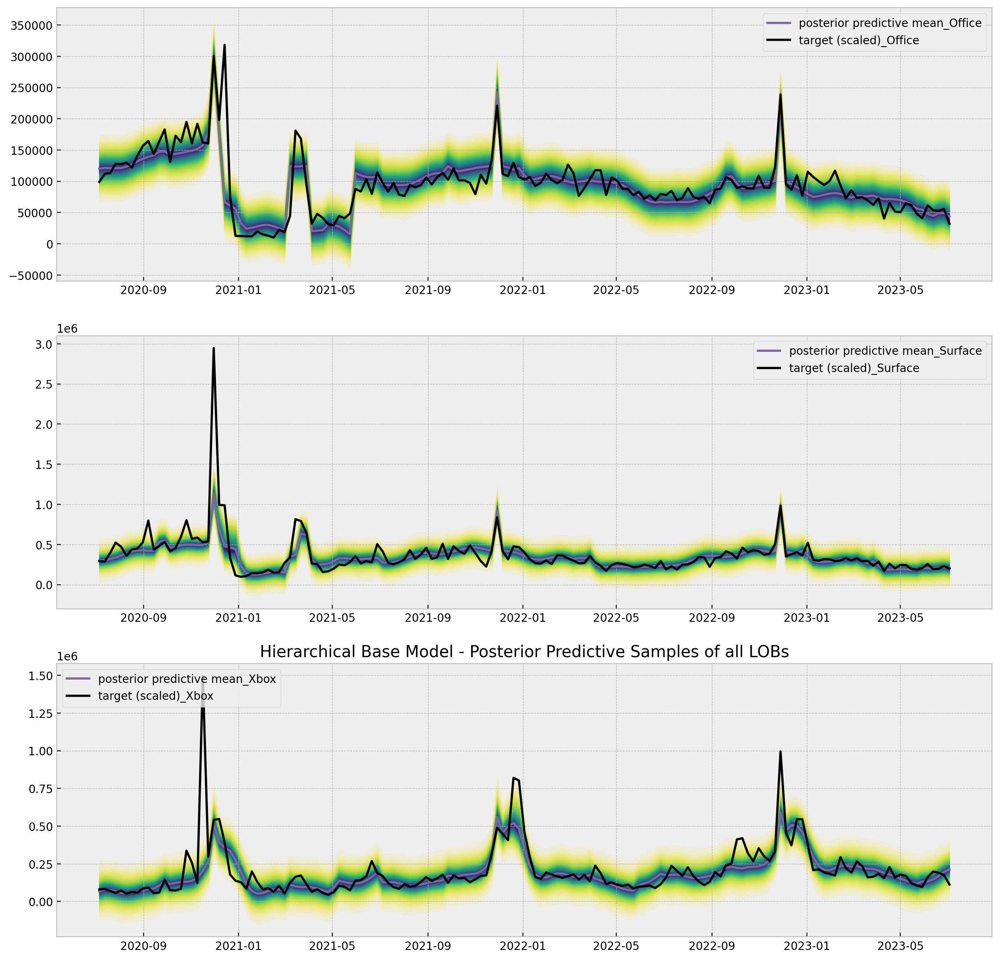

In [91]:
posteriors = [posterior_predictive_likelihood_inv_office, posterior_predictive_likelihood_inv_surface, posterior_predictive_likelihood_inv_xox]

fig, axs = plt.subplots(3, 1, figsize=(15, 15))

for j, posterior in enumerate(posteriors):

    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(posterior, p, axis=1)
        lower = np.percentile(posterior, 100 - p, axis=1)
        color_val = colors[i]
        ax= axs[j]
        ax.fill_between(
            x=date,
            y1=upper,
            y2=lower,
            color=cmap(color_val),
            alpha=0.1,
        )

    sns.lineplot(
        x=date,
        y=posterior.mean(axis=1),
        color="C2",
        label=f"posterior predictive mean_{LOBS[j]}",
        ax=ax,
    )
    sns.lineplot(
        x=date,
        y=surface_sales[surface_sales['LOB'] == LOBS[j]]['Rslr Sales Amount'].to_numpy(),
        color="black",
        label=f"target (scaled)_{LOBS[j]}",
        ax=ax,
    )
plt.legend(loc="upper left")
plt.title("Hierarchical Base Model - Posterior Predictive Samples of all LOBs");

In [77]:
surface_sales[surface_sales['LOB'] == 'Surface'][['Broadcast Product Placement','Digital Display Advertising', 'POS - Visual Merchandise', 'PrintOut of Home', 'Print Single page- Dual Page- Fold Out']].sum()

Broadcast Product Placement                22991.0
Digital Display Advertising                37742.0
POS - Visual Merchandise                  737796.0
PrintOut of Home                           41333.0
Print Single page- Dual Page- Fold Out    283451.0
dtype: float64

In [94]:
scaledmedia_channles

['Broadcast Product Placement_scaled',
 'Digital Display Advertising_scaled',
 'POS - Visual Merchandise_scaled',
 'PrintOut of Home_scaled',
 'Print Single page- Dual Page- Fold Out_scaled']

### ROAS calculation for the each channel 

In [110]:


scaledmedia_channles = ['Broadcast Product Placement_scaled',
 'Digital Display Advertising_scaled',
 'POS - Visual Merchandise_scaled',
 'PrintOut of Home_scaled',
 'Print Single page- Dual Page- Fold Out_scaled']


likelihoods = ['likelihood_Office', 'likelihood_Surface', 'likelihood_Xbox']


BaseROAS_surface_channels = []
BaseROAS_surface_channelsmean = []
BaseROAS_surface_channelsHDI = []

BaseROAS_office_channels = []
BaseROAS_office_channelsmean = []
BaseROAS_office_channelsHDI = []

BaseROAS_Xbox_channels = []
BaseROAS_Xbox_channelsmean = []
BaseROAS_Xbox_channelsHDI = []


for likelihood in likelihoods:
    print(likelihood)

    base_model_trace_roas = base_model_trace.copy()

    for i, channel in enumerate(scaledmedia_channles):

        with base_model:
            LOB = likelihood.removeprefix('likelihood_')
            pm.set_data(new_data={f"z_{LOB}_{channel}": np.zeros_like(a=surface_sales[surface_sales['LOB'] == likelihood.removeprefix('likelihood_')][channel].to_numpy())})
            base_model_trace_roas.extend(
                other=pm.sample_posterior_predictive(trace=base_model_trace_roas, var_names=[likelihood])
            )

        asdr_roas_numerator_channel1 = (
            endog_scaler.inverse_transform(
                X=az.extract(
                    data=base_model_posterior_predictive,
                    group="posterior_predictive",
                    var_names=[likelihood],
                )

            )
            - endog_scaler.inverse_transform(
                X=az.extract(
                    data=base_model_trace_roas,
                    group="posterior_predictive",
                    var_names=[likelihood],
                )
            )
        ).sum(axis=0)

        roas_channel1_denominator = surface_sales[surface_sales['LOB'] == likelihood.removeprefix('likelihood_')][channel.removesuffix('_scaled')].sum()
        asdr_roas_channel1 = asdr_roas_numerator_channel1 / roas_channel1_denominator

        if likelihood == 'likelihood_Surface':
            BaseROAS_surface_channels.append(asdr_roas_channel1)
            BaseROAS_surface_channelsmean.append(np.mean(asdr_roas_channel1))
            BaseROAS_surface_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))
        elif likelihood == 'likelihood_Office' :
            BaseROAS_office_channels.append(asdr_roas_channel1)
            BaseROAS_office_channelsmean.append(np.mean(asdr_roas_channel1))
            BaseROAS_office_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))
        else:
            BaseROAS_Xbox_channels.append(asdr_roas_channel1)
            BaseROAS_Xbox_channelsmean.append(np.mean(asdr_roas_channel1))
            BaseROAS_Xbox_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))

likelihood_Office


Sampling: [likelihood_Office]


C:\Users\raviteja.kurva\AppData\Local\Temp\ipykernel_10812\2601598131.py:57: RuntimeWarning: divide by zero encountered in divide
  asdr_roas_channel1 = asdr_roas_numerator_channel1 / roas_channel1_denominator
c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Sampling: [likelihood_Office]


Sampling: [likelihood_Office]


Sampling: [likelihood_Office]


Sampling: [likelihood_Office]


likelihood_Surface


Sampling: [likelihood_Surface]


Sampling: [likelihood_Surface]


Sampling: [likelihood_Surface]


Sampling: [likelihood_Surface]


Sampling: [likelihood_Surface]


likelihood_Xbox


Sampling: [likelihood_Xbox]


Sampling: [likelihood_Xbox]


Sampling: [likelihood_Xbox]


Sampling: [likelihood_Xbox]


Sampling: [likelihood_Xbox]


In [116]:
media_channles[0]

'Broadcast Product Placement'

#### ROAS for surface LOB

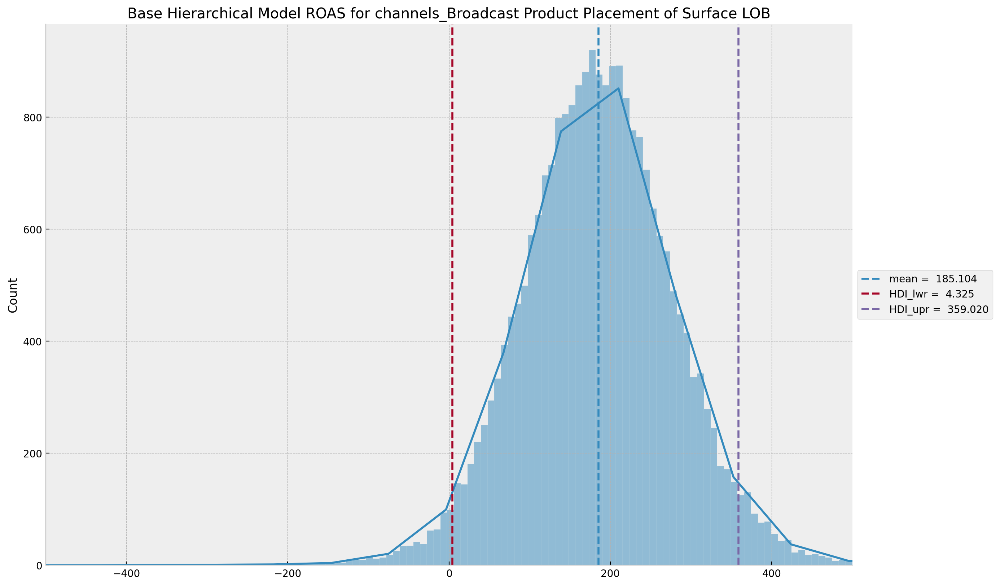

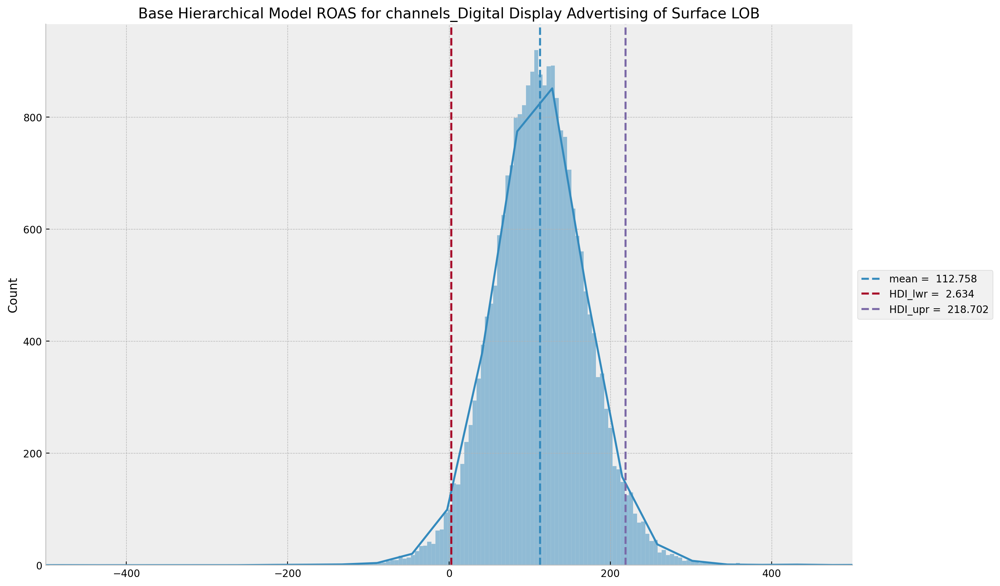

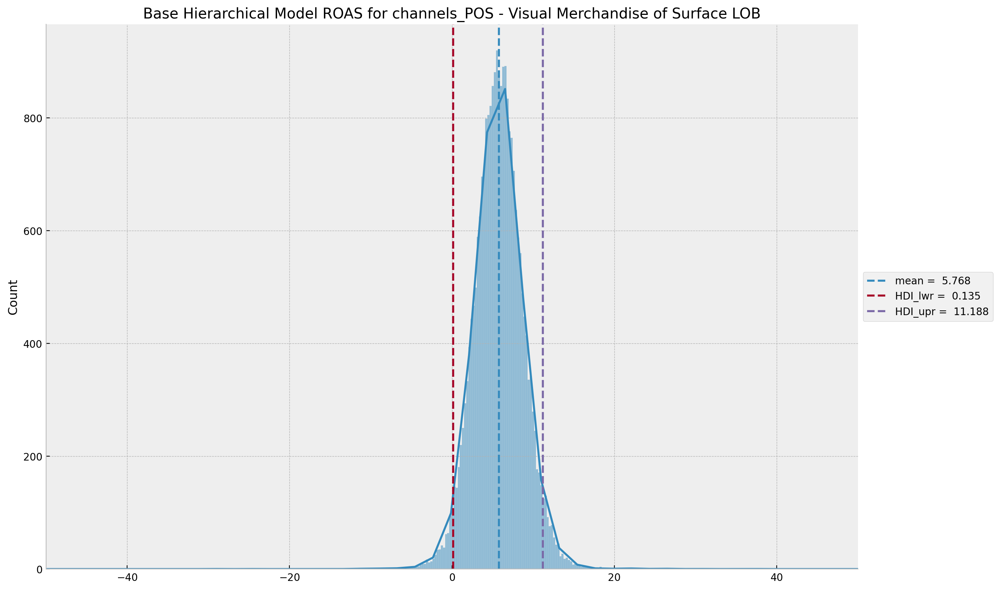

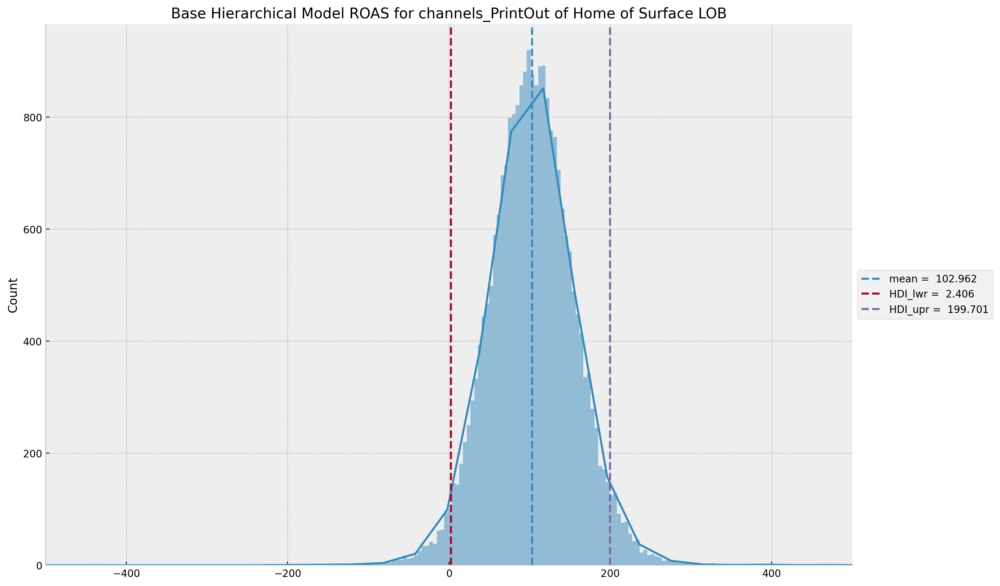

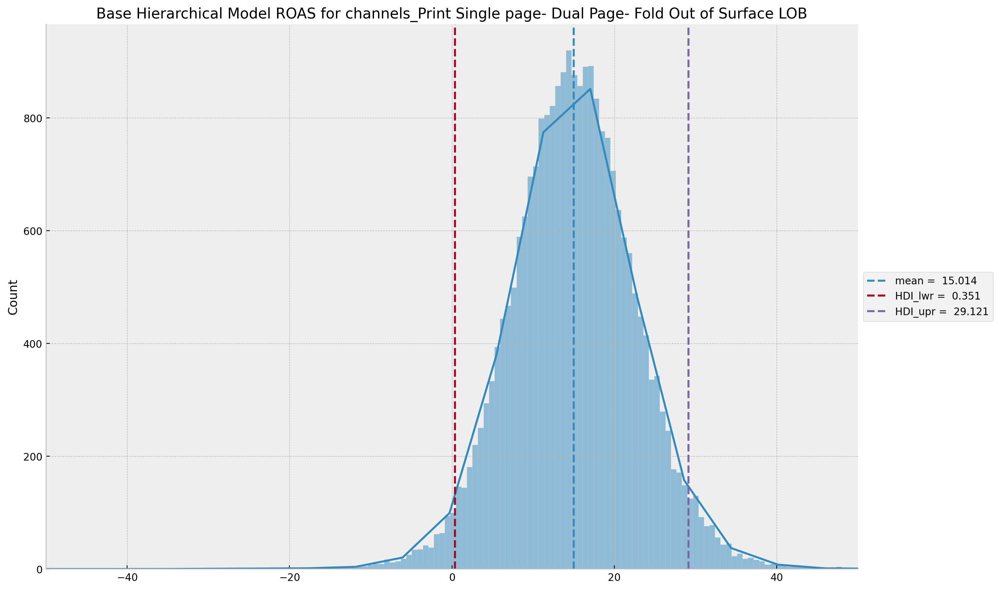

In [117]:
# Set the desired lower and upper bounds for the x-axis
lower_bound = -100.0  # Replace this with your desired lower bound
upper_bound = 100.0  # Replace this with your desired upper bound


# Create the plot
for num, channel_roas in enumerate(BaseROAS_surface_channels): 
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [0, 1, 3]:
        plt.xlim(-500, 500)
    else:
        plt.xlim(-50, 50)

    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Base Hierarchical Model ROAS for channels_{channel_name} of Surface LOB");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()


#### ROAS for Office LOB

c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


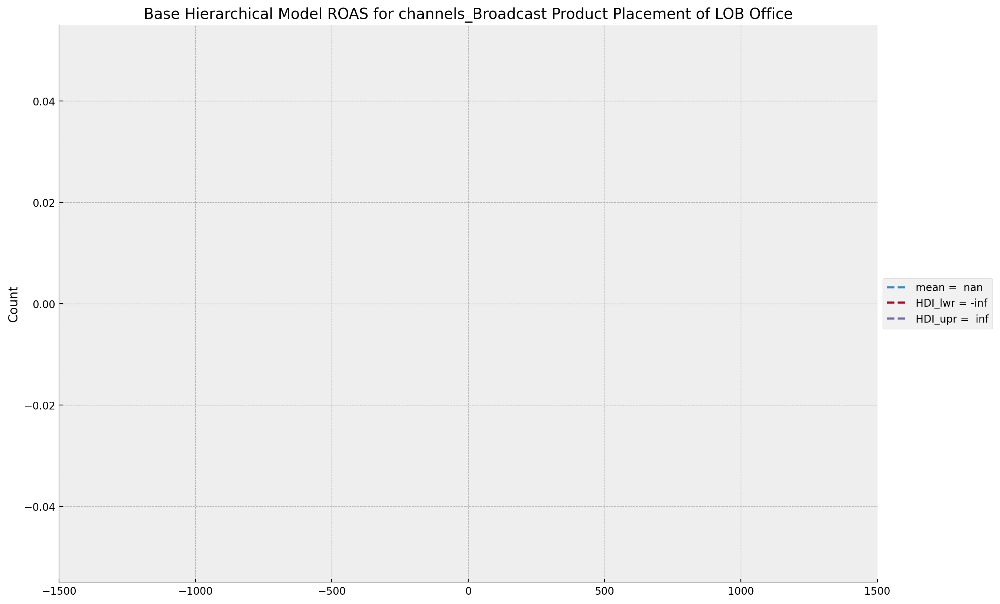

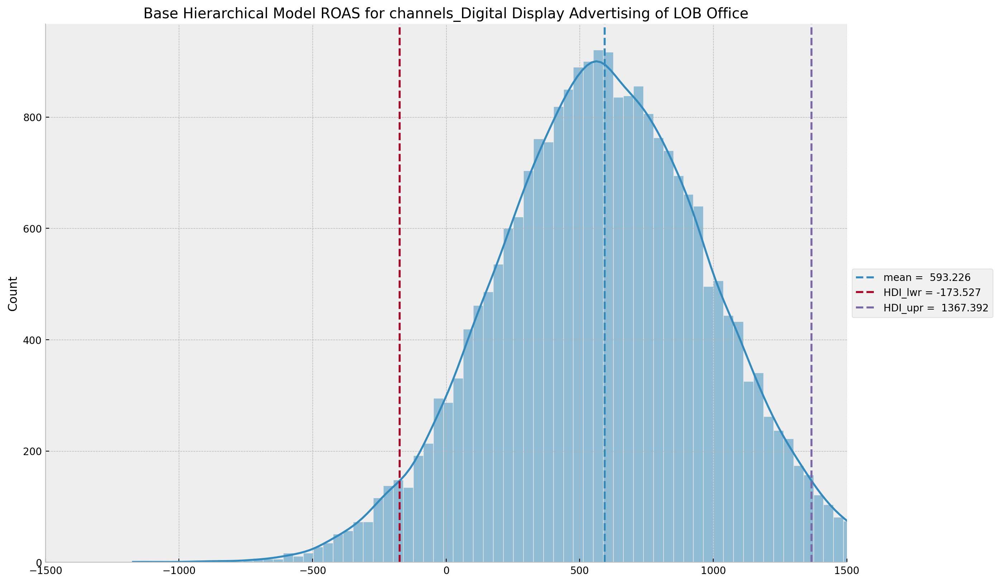

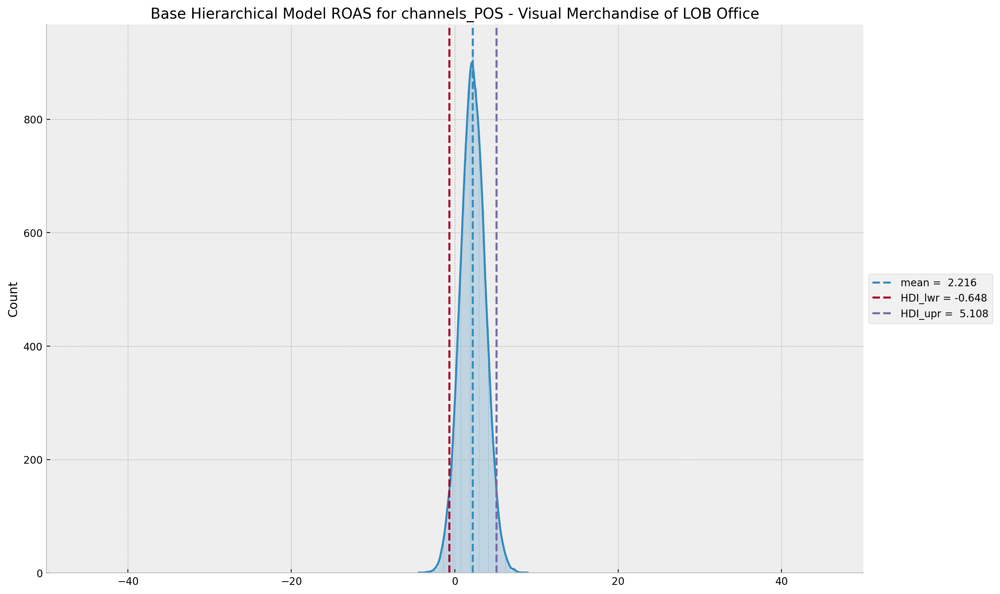

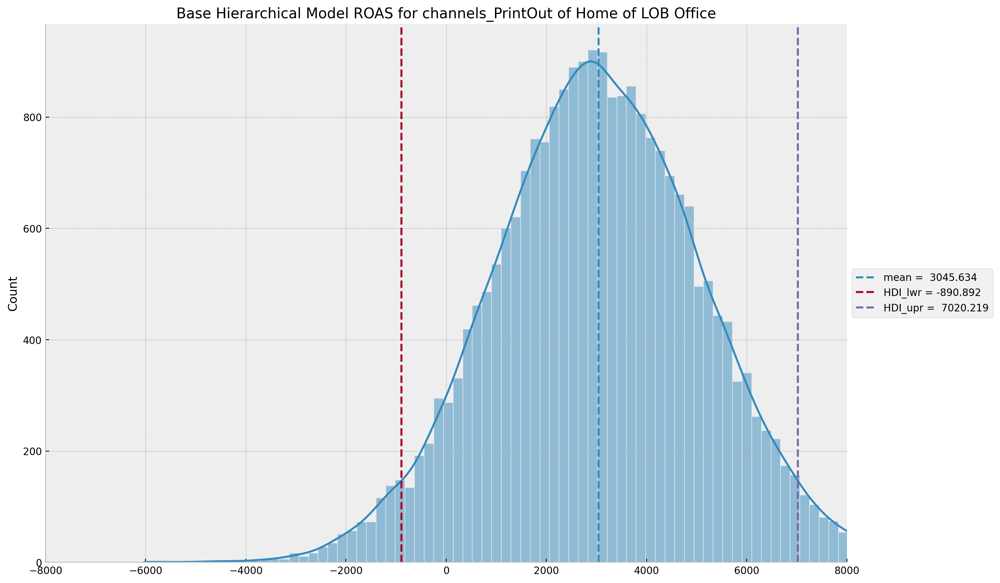

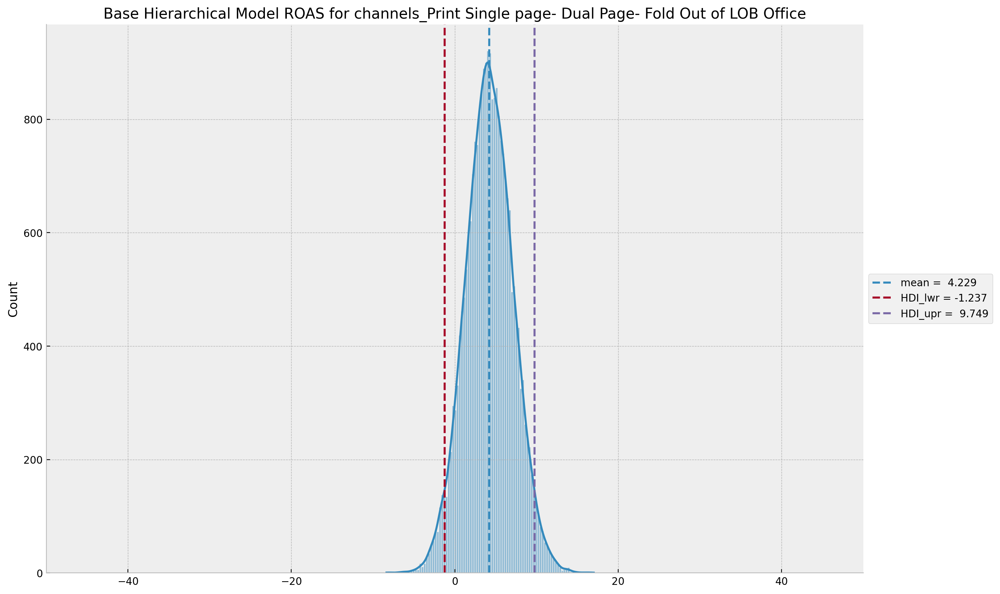

In [122]:
# Create the plot
for num, channel_roas in enumerate(BaseROAS_office_channels):
    
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [0, 1]:
        plt.xlim(-1500, 1500)
    elif num  == 3:
        plt.xlim(-8000, 8000)
    else:
        plt.xlim(-50, 50)

    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Base Hierarchical Model ROAS for channels_{channel_name} of LOB Office");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()


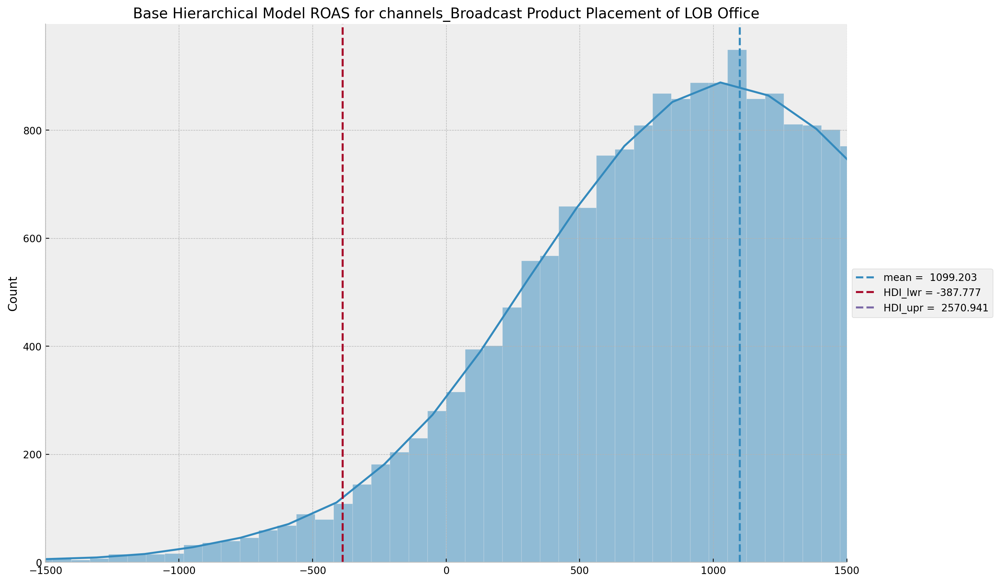

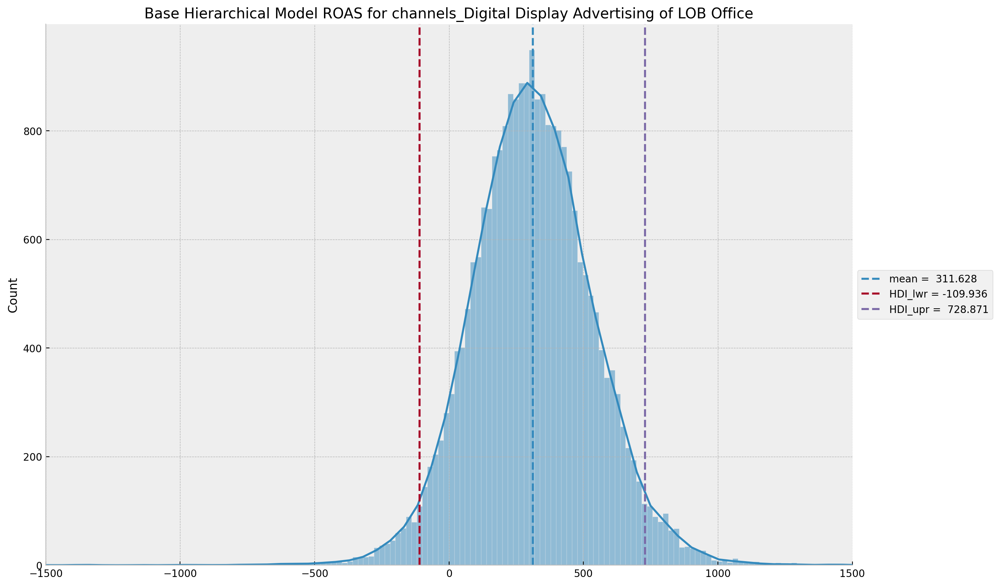

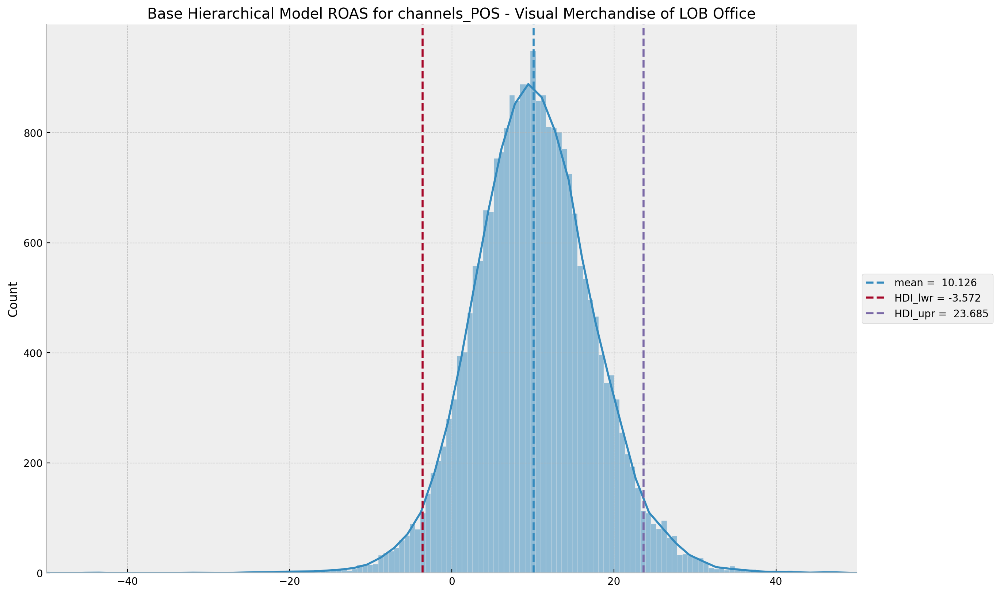

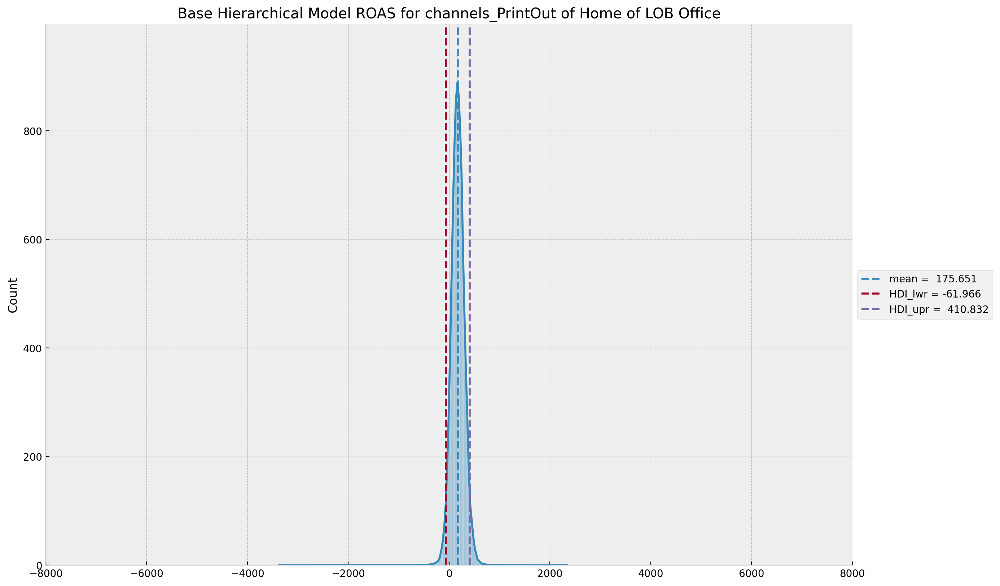

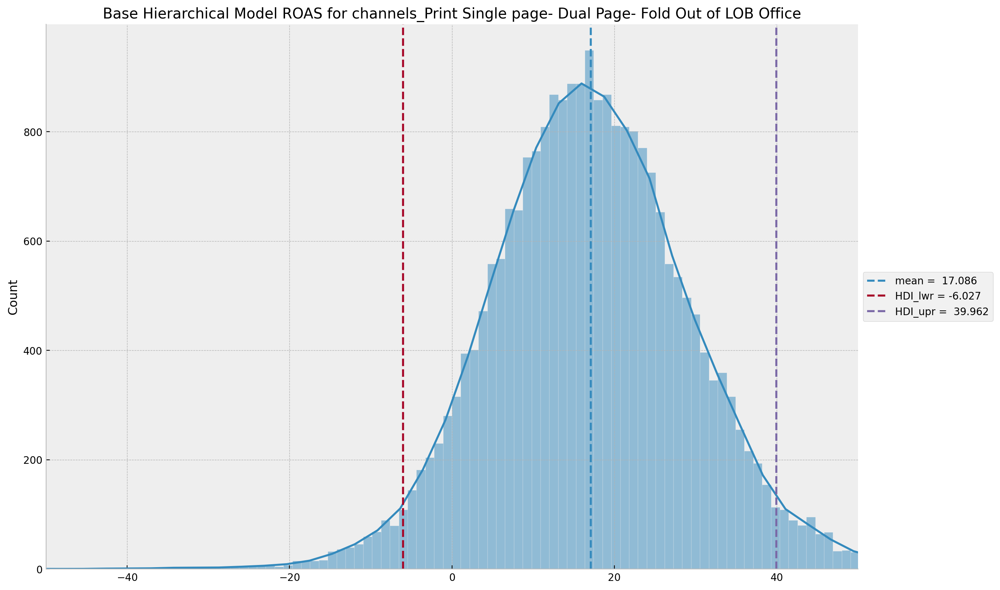

In [124]:
# Create the plotBaseROAS_Xbox_channels
for num, channel_roas in enumerate(BaseROAS_Xbox_channels):
    
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [0, 1]:
        plt.xlim(-1500, 1500)
    elif num  == 3:
        plt.xlim(-8000, 8000)
    else:
        plt.xlim(-50, 50)

    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Base Hierarchical Model ROAS for channels_{channel_name} of LOB Office");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()


### Modelling with Time varying intercept, slope with Adstock and transformation on Marketing channels

In [144]:
surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Office') & (surface_sales['Sales_Date'].dt.year == 2020) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day > 7) &
(surface_sales['Sales_Date'].dt.day <= 14), 1, 0)
surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Office') & (surface_sales['Sales_Date'].dt.year == 2021) & (surface_sales['Sales_Date'].dt.month == 3) & (surface_sales['Sales_Date'].dt.day > 8) & 
(surface_sales['Sales_Date'].dt.day <= 29), 1, surface_sales['special_event'])


surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Surface') & (surface_sales['Sales_Date'].dt.year == 2021) & (surface_sales['Sales_Date'].dt.month == 3) & (surface_sales['Sales_Date'].dt.day >= 15) & 
(surface_sales['Sales_Date'].dt.day <= 29), 1, surface_sales['special_event'])


surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2020) & (surface_sales['Sales_Date'].dt.month == 11) & (surface_sales['Sales_Date'].dt.day >= 9) & 
(surface_sales['Sales_Date'].dt.day <= 16), 1, surface_sales['special_event'])

surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2021) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 13) & 
(surface_sales['Sales_Date'].dt.day <= 27), 1, surface_sales['special_event'])

surface_sales['special_event'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'].dt.year == 2022) & (surface_sales['Sales_Date'].dt.month == 12) & (surface_sales['Sales_Date'].dt.day >= 12) & 
(surface_sales['Sales_Date'].dt.day <= 26), 1, surface_sales['special_event'])

In [125]:
coords_hier = {"date": date, "fourier_mode": np.arange(2 * n_order)}

In [190]:
for lob in surface_sales['LOB'].unique().tolist():

    print(lob)

Office
Surface
Xbox


#### Introduce the Guassian bump for the peak 

In [158]:
surface_sales['dump_peak'] = np.where((surface_sales['LOB'] == 'Surface') & (surface_sales['Sales_Date'] == '30-11-2020'),  1, 0)
surface_sales['dump_peak'] = np.where((surface_sales['LOB'] == 'Xbox') & (surface_sales['Sales_Date'] == '16-11-2020'),  1, surface_sales['dump_peak'])

In [159]:
required_columns + ['dump_peak']

['LOB',
 'Sales_Date',
 'black_week',
 'Covid_effect',
 'special_event',
 'target_scaled',
 'Broadcast Product Placement_scaled',
 'Digital Display Advertising_scaled',
 'POS - Visual Merchandise_scaled',
 'PrintOut of Home_scaled',
 'Print Single page- Dual Page- Fold Out_scaled',
 'dump_peak']

In [163]:
with pm.Model(coords=coords) as heriarchical_model:

    # --- coords ---
    # heriarchical_model.add_coord(name="dat", values=date, mutable=True)
    # heriarchical_model.add_coord(name="fourier_mode", values=np.arange(2 * n_order), mutable=False)

    for lob in surface_sales['LOB'].unique().tolist():

        lob_data = surface_sales.loc[surface_sales['LOB'] == lob].reset_index(drop=True)
        lob_data = lob_data[required_columns + ['dump_peak']]
        date_index = lob_data.index
        y = lob_data[target].to_numpy()
        t = (lob_data.index - lob_data.index.min()) / (lob_data.index.max() - lob_data.index.min())
        t = t.values
        n_obs = y.size

        # --- priors ---
        ## intercept
        a = pm.Normal(name=f"a_{lob}", mu=0, sigma=4)
        ## trend
        b_trend = pm.Normal(name=f"b_trend_{lob}", mu=0, sigma=2)
        ## seasonality
        b_fourier = pm.Laplace(name=f"b_fourier_{lob}", mu=0, b=2, dims="fourier_mode")

        ## standard deviation of the normal likelihood
        sigma = pm.HalfNormal(name=f"sigma_{lob}", sigma=0.5)
        # degrees of freedom of the t distribution
        nu = pm.Gamma(name=f"nu_{lob}", alpha=15, beta=1)

        ## gaussian random walk standard deviation
        sigma_slope = pm.HalfNormal(name=f"sigma_slope_{lob}", sigma=0.05)
        slopes = pm.GaussianRandomWalk(name=f"slopes_{lob}",
                                       sigma=sigma_slope,
                                       init_dist=pm.distributions.continuous.Normal.dist(name=f"init_dist_{lob}", mu=0, sigma=2),
                                       dims="date",)


        ## adstock effect
        alpha = pm.Beta(name=f"alpha_{lob}", alpha=1, beta=1)
        ## saturation effect
        lam = pm.Gamma(name=f"lam_{lob}", alpha=1, beta=1)

        # --- channel contribution ---
        channel_contributions = []
        for channel in scaledmedia_channles:
            
            # --- data containers ---
            z_scaled_ = pm.MutableData(name=f"z_{lob}_{channel}", value=lob_data[channel].to_numpy(), dims="date")
           
            if channel in ['Broadcast Product Placement_scaled', 'Digital Display Advertising_scaled', 'PrintOut of Home_scaled'] :
                channel_adstock = pm.Deterministic(name=f"channeladstock_{lob}_{channel}", var=geometric_adstock(x=z_scaled_, alpha=alpha, l_max=4), dims="date")
                channel_saturated = pm.Deterministic(name=f"channeladstock_saturated_{lob}_{channel}", var=logistic_saturation(x=channel_adstock, lam=lam), dims="date")
                channel_effect = pm.Deterministic(name=f"channel_effect_{lob}_{channel}", var=pm.math.exp(slopes) * channel_saturated, dims="date")

            else:
                channel_effect = pm.Deterministic(name=f"channel_effect_{lob}_{channel}", var=pm.math.exp(slopes) * z_scaled_, dims="date")

            channel_contributions.append(channel_effect)


        # --- model parametrization ---
        trend = pm.Deterministic(name=f"trend_{lob}", var=a + b_trend * t, dims="date")
        seasonality = pm.Deterministic(
            name=f"seasonality_{lob}", var=pm.math.dot(fourier_features, b_fourier), dims="date"
        )

        # --- control variable ---i.e. special events
        covid_effect = pm.Normal(f"covid20_{lob}", mu = 0, sigma = 1)
        blackweek_effect = pm.Normal(f"Blackweekpromotion_{lob}", mu = 0, sigma = 1)
        special_effect = pm.Normal(f"Special_event_{lob}", mu = 0, sigma = 1)
        bump1 = pm.Normal(f'bump1_{lob}', mu=0, sigma=0.1)

        covid_event = pm.Deterministic(name=f'Covid_imapct_{lob}', var = covid_effect*lob_data['Covid_effect'].to_numpy(), dims= 'date')
        blackweek_event = pm.Deterministic(name=f'Blackweek_imapct_{lob}', var = blackweek_effect*lob_data['black_week'].to_numpy(), dims='date')
        special_event = pm.Deterministic(name=f'specialevent_imapct_{lob}', var = special_effect*lob_data['special_event'].to_numpy(), dims='date')
        peak_event = pm.Deterministic(name=f'peak_imapct_{lob}', var = bump1*lob_data['dump_peak'].to_numpy(), dims='date')

        mu = pm.Deterministic(name=f"mu_{lob}", var=trend + seasonality + pm.math.sum(channel_contributions, axis=0) + blackweek_event + covid_event+special_event+peak_event, dims="date")

        # --- likelihood ---
        pm.StudentT(name=f"likelihood_{lob}", nu=nu, sigma=sigma,  mu=mu, observed=y, dims="date")

    # --- prior samples ---
    hierarchical_model_prior_predictive = pm.sample_prior_predictive()



Sampling: [Blackweekpromotion_Office, Blackweekpromotion_Surface, Blackweekpromotion_Xbox, Special_event_Office, Special_event_Surface, Special_event_Xbox, a_Office, a_Surface, a_Xbox, alpha_Office, alpha_Surface, alpha_Xbox, b_fourier_Office, b_fourier_Surface, b_fourier_Xbox, b_trend_Office, b_trend_Surface, b_trend_Xbox, bump1_Office, bump1_Surface, bump1_Xbox, covid20_Office, covid20_Surface, covid20_Xbox, lam_Office, lam_Surface, lam_Xbox, likelihood_Office, likelihood_Surface, likelihood_Xbox, nu_Office, nu_Surface, nu_Xbox, sigma_Office, sigma_Surface, sigma_Xbox, sigma_slope_Office, sigma_slope_Surface, sigma_slope_Xbox, slopes_Office, slopes_Surface, slopes_Xbox]


In [164]:
with heriarchical_model:
    heriarchical_model_trace = pm.sample(
        nuts_sampler="numpyro",
        draws=6_000,
        chains=4,
        idata_kwargs={"log_likelihood": True},
    )
    heriarchical_model_posterior_predictive = pm.sample_posterior_predictive(
        trace=heriarchical_model_trace
    )

c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\pymc\sampling\mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...
Compilation time =  0:00:27.358503
Sampling...


Compiling.. :   0%|          | 0/7000 [00:00<?, ?it/s]








Running chain 0:   5%|▌         | 350/7000 [00:40<06:04, 18.25it/s]


Running chain 0:   5%|▌         | 350/7000 [00:53<06:04, 18.25it/s]


Running chain 0:  10%|█         | 700/7000 [00:57<05:16, 19.91it/s]


Running chain 0:  10%|█         | 700/7000 [01:13<05:16, 19.91it/s]


Running chain 0:  15%|█▌        | 1050/7000 [01:18<05:31, 17.98it/s]


Running chain 0:  20%|██        | 1400/7000 [01:43<04:42, 19.83it/s]




Running chain 0:  25%|██▌       | 1750/7000 [02:03<04:17, 20.36it/s]


Running chain 0:  30%|███       | 2100/7000 [02:04<03:48, 21.43it/s]


Running chain 0:  30%|███       | 2100/7000 [02:23<03:48, 21.43it/s]

Running chain 0:  35%|███▌      | 2450/7000 [02:24<03:44, 20.24it/s]



Running chain 0:  40%|████      | 2800/7000 [02:48<03:55, 17.83it/s]



Running chain 0:  40%|████      | 2800/7000 [03:03<03:55, 17.83it/s]

Running chain 0:  45%|████▌     | 3150/7000 [03:23<03:38, 17.62it/s]




Running chain 

Sampling time =  0:08:35.243617
Transforming variables...
Transformation time =  0:00:03.113126
Computing Log Likelihood...
Log Likelihood time =  0:00:05.451673


Sampling: [likelihood_Office, likelihood_Surface, likelihood_Xbox]


In [165]:
varables = []

for elem in ["a", "b_trend", "sigma_slope", "alpha", "lam", "sigma", "nu"]:
    for lob in ['Office', 'Surface', 'Xbox']:
        var = elem+'_'+lob
        varables.append(var)


In [166]:
az.summary(
    data=heriarchical_model_trace,
    var_names=varables
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_Office,0.048,0.002,0.044,0.051,0.000,0.000,947.0,6727.0,1.01
a_Surface,0.132,0.005,0.123,0.140,0.000,0.000,11050.0,13305.0,1.00
a_Xbox,0.037,0.006,0.027,0.048,0.000,0.000,319.0,2452.0,1.00
b_trend_Office,-0.026,0.003,-0.031,-0.021,0.000,0.000,1971.0,8505.0,1.00
b_trend_Surface,-0.039,0.007,-0.052,-0.025,0.000,0.000,13432.0,14299.0,1.00
b_trend_Xbox,0.043,0.008,0.028,0.058,0.000,0.000,602.0,3333.0,1.00
sigma_slope_Office,0.083,0.043,0.010,0.148,0.005,0.004,57.0,131.0,1.07
sigma_slope_Surface,0.045,0.028,0.007,0.095,0.003,0.002,81.0,177.0,1.04
sigma_slope_Xbox,0.100,0.056,0.012,0.190,0.006,0.004,86.0,168.0,1.01
alpha_Office,0.493,0.286,0.014,0.948,0.002,0.002,15323.0,12092.0,1.00


c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\arviz\plots\traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (21), generating only 20 plots
  warnings.warn(


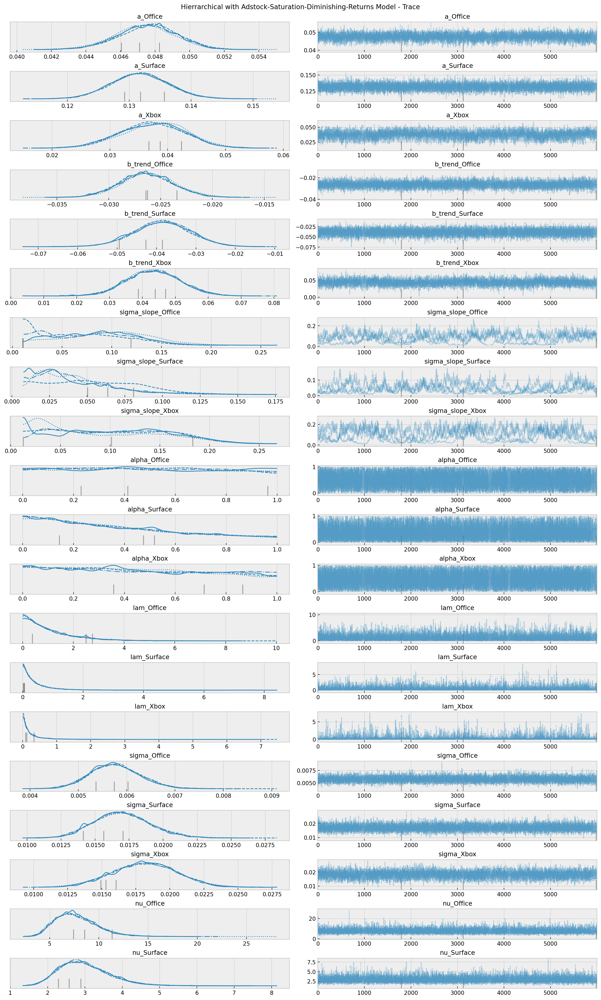

In [167]:
axes = az.plot_trace(
    data=heriarchical_model_trace,
    var_names=varables,
    compact=True,
    backend_kwargs={"figsize": (15, 25), "layout": "constrained"},
)
fig = axes[0][0].get_figure()
fig.suptitle("Hierrarchical with Adstock-Saturation-Diminishing-Returns Model - Trace");

In [168]:
posterior_predictive_likelihood1 = az.extract(
    data=heriarchical_model_posterior_predictive,
    group="posterior_predictive",
    var_names = ['likelihood_Office', 'likelihood_Surface', 'likelihood_Xbox'])

posterior_predictive_likelihood_inv_office1 = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood1['likelihood_Office']
)

posterior_predictive_likelihood_inv_surface1 = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood1['likelihood_Surface']
)

posterior_predictive_likelihood_inv_xox1 = endog_scaler.inverse_transform(
    X=posterior_predictive_likelihood1['likelihood_Xbox']
)

likelihoods = ['likelihood_Office', 'likelihood_Surface', 'likelihood_Xbox']

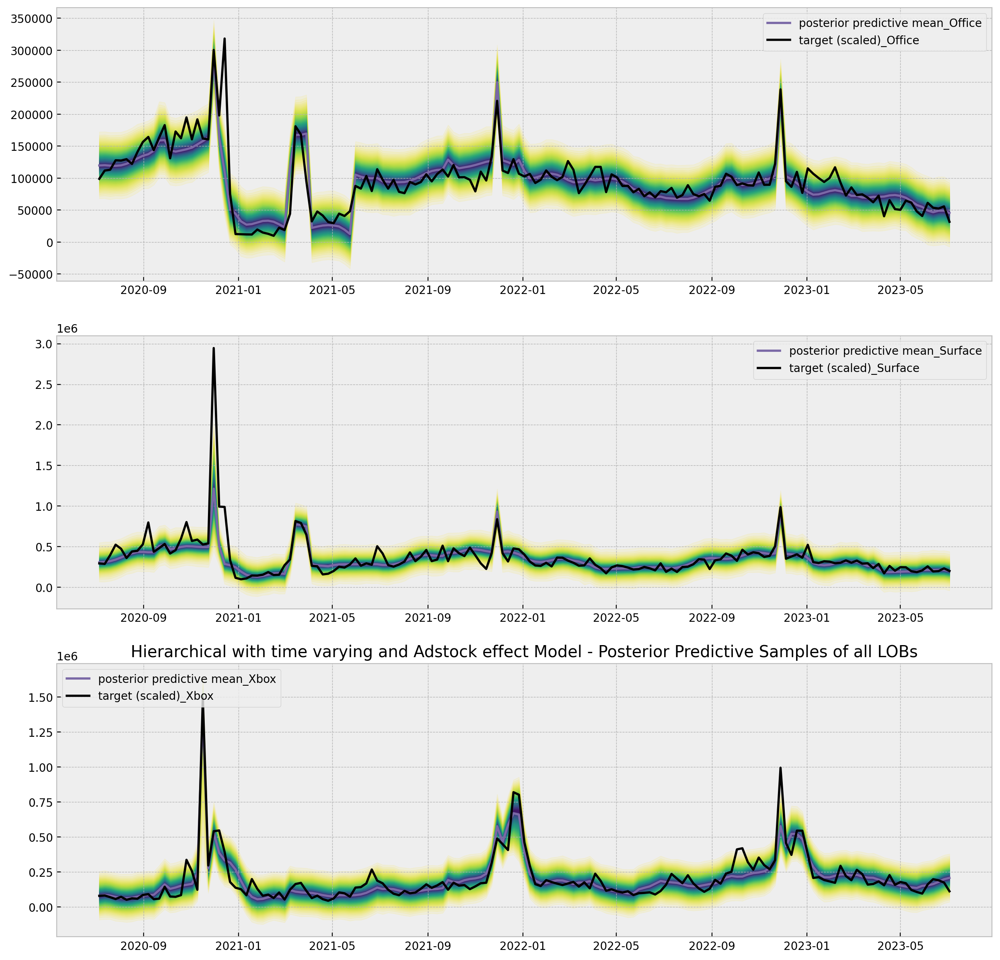

In [169]:
posteriors = [posterior_predictive_likelihood_inv_office1, posterior_predictive_likelihood_inv_surface1, posterior_predictive_likelihood_inv_xox1]

fig, axs = plt.subplots(3, 1, figsize=(15, 15))

for j, posterior in enumerate(posteriors):

    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(posterior, p, axis=1)
        lower = np.percentile(posterior, 100 - p, axis=1)
        color_val = colors[i]
        ax= axs[j]
        ax.fill_between(
            x=date,
            y1=upper,
            y2=lower,
            color=cmap(color_val),
            alpha=0.1,
        )

    sns.lineplot(
        x=date,
        y=posterior.mean(axis=1),
        color="C2",
        label=f"posterior predictive mean_{LOBS[j]}",
        ax=ax,
    )
    sns.lineplot(
        x=date,
        y=surface_sales[surface_sales['LOB'] == LOBS[j]]['Rslr Sales Amount'].to_numpy(),
        color="black",
        label=f"target (scaled)_{LOBS[j]}",
        ax=ax,
    )
plt.legend(loc="upper left")
plt.title("Hierarchical with time varying and Adstock effect Model - Posterior Predictive Samples of all LOBs");

In [ ]:
"channel1_effect", "channel2_effect", 'channel3_effect', 'channel4_effect', 'channel5_effect', "trend", "seasonality", 'Covid_imapct', 'Blackweek_imapct'

In [170]:
media_vars =[]

for elem in ["channel_effect", "channel_effect", 'channel_effect', 'channel_effect', 'channel_effect']:
    for lob in ['Office', 'Surface', 'Xbox']:
        for channel in media_channles:
            var = elem+'_'+lob+'_'+channel
            media_vars.append(var)

In [171]:
lob_vars =[]

for elem in ["trend", "seasonality", 'Covid_imapct', 'Blackweek_imapct', 'specialevent_imapct']:
    for lob in ['Office', 'Surface', 'Xbox']:
        var = elem+'_'+lob
        lob_vars.append(var)

[Text(0.5, 1.0, 'Hierrachical Model Components of Office lob'),
 Text(0, 0.5, 'target')]

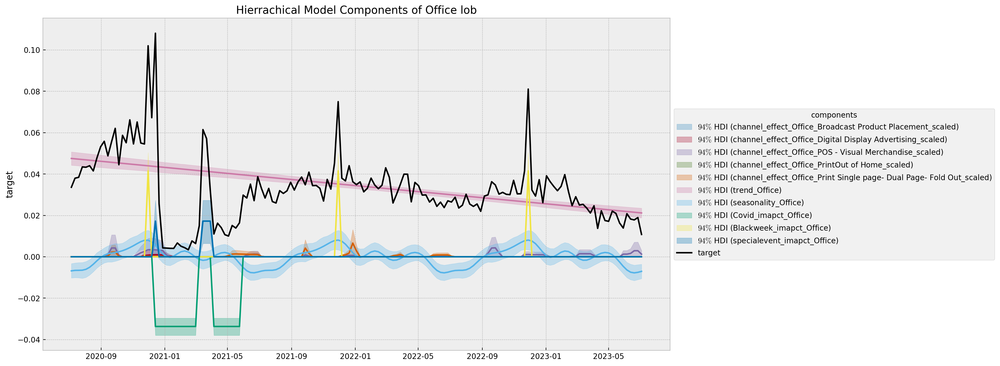

In [172]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=heriarchical_model_trace)

fig, ax = plt.subplots(figsize=(15, 8))

for i, var_effect in enumerate(['channel_effect_Office_Broadcast Product Placement_scaled',
 'channel_effect_Office_Digital Display Advertising_scaled',
 'channel_effect_Office_POS - Visual Merchandise_scaled',
 'channel_effect_Office_PrintOut of Home_scaled',
 'channel_effect_Office_Print Single page- Dual Page- Fold Out_scaled',
 'trend_Office',
 'seasonality_Office',
 'Covid_imapct_Office',
 'Blackweek_imapct_Office',
 'specialevent_imapct_Office']):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=heriarchical_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(
    x=date, y=surface_sales[surface_sales['LOB'] == 'Office'][target].to_numpy(), color="black", alpha=1.0, label="target", ax=ax
)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(
    title="Hierrachical Model Components of Office lob",
    ylabel="target",)

[Text(0.5, 1.0, 'Hierrachical Model Components of Surface lob'),
 Text(0, 0.5, 'target')]

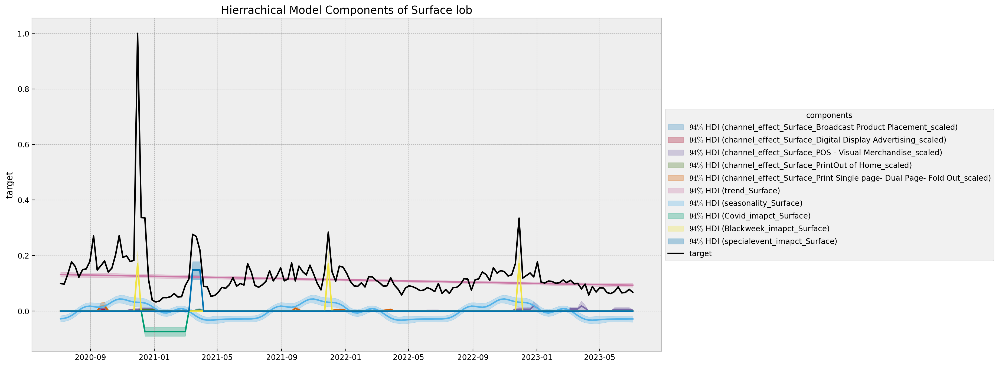

In [173]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=heriarchical_model_trace)

fig, ax = plt.subplots(figsize=(15, 8))

for i, var_effect in enumerate(['channel_effect_Surface_Broadcast Product Placement_scaled',
 'channel_effect_Surface_Digital Display Advertising_scaled',
 'channel_effect_Surface_POS - Visual Merchandise_scaled',
 'channel_effect_Surface_PrintOut of Home_scaled',
 'channel_effect_Surface_Print Single page- Dual Page- Fold Out_scaled',
 'trend_Surface',
 'seasonality_Surface',
 'Covid_imapct_Surface',
 'Blackweek_imapct_Surface',
 'specialevent_imapct_Surface']):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=heriarchical_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(
    x=date, y=surface_sales[surface_sales['LOB'] == 'Surface'][target].to_numpy(), color="black", alpha=1.0, label="target", ax=ax
)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(
    title="Hierrachical Model Components of Surface lob",
    ylabel="target",)

[Text(0.5, 1.0, 'Hierrachical Model Components of Xbox lob'),
 Text(0, 0.5, 'target')]

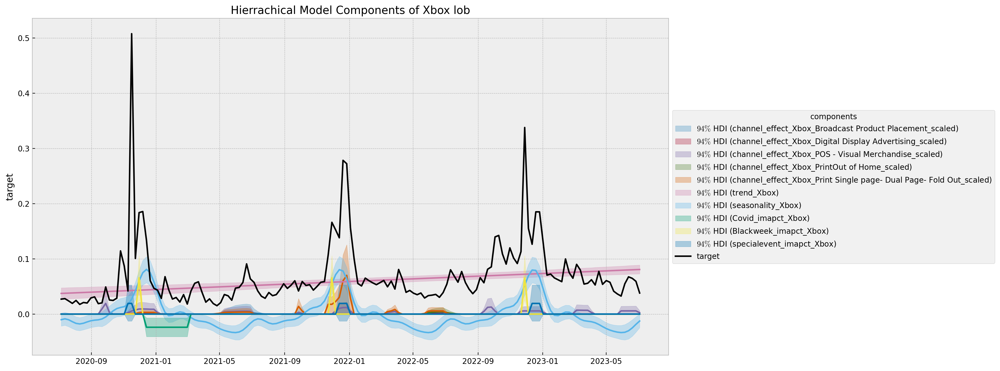

In [174]:
# compute HDI for all the model parameters
model_hdi = az.hdi(ary=heriarchical_model_trace)

fig, ax = plt.subplots(figsize=(15, 8))

for i, var_effect in enumerate(['channel_effect_Xbox_Broadcast Product Placement_scaled',
 'channel_effect_Xbox_Digital Display Advertising_scaled',
 'channel_effect_Xbox_POS - Visual Merchandise_scaled',
 'channel_effect_Xbox_PrintOut of Home_scaled',
 'channel_effect_Xbox_Print Single page- Dual Page- Fold Out_scaled',
 'trend_Xbox',
 'seasonality_Xbox',
 'Covid_imapct_Xbox',
 'Blackweek_imapct_Xbox',
 'specialevent_imapct_Xbox']):
    ax.fill_between(
        x=date,
        y1=model_hdi[var_effect][:, 0],
        y2=model_hdi[var_effect][:, 1],
        color=f"C{i}",
        alpha=0.3,
        label=f"$94\%$ HDI ({var_effect})",
    )
    sns.lineplot(
        x=date,
        y=heriarchical_model_trace.posterior[var_effect]
        .stack(sample=("chain", "draw"))
        .mean(axis=1),
        color=f"C{i}",
    )

sns.lineplot(
    x=date, y=surface_sales[surface_sales['LOB'] == 'Xbox'][target].to_numpy(), color="black", alpha=1.0, label="target", ax=ax
)
ax.legend(title="components", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(
    title="Hierrachical Model Components of Xbox lob",
    ylabel="target",)

#### ROAS for 2nd model i.e. Time varying slope and intercept 

In [175]:
scaledmedia_channles = ['Broadcast Product Placement_scaled',
 'Digital Display Advertising_scaled',
 'POS - Visual Merchandise_scaled',
 'PrintOut of Home_scaled',
 'Print Single page- Dual Page- Fold Out_scaled']


likelihoods = ['likelihood_Office', 'likelihood_Surface', 'likelihood_Xbox']


HierROAS_surface_channels = []
HierROAS_surface_channelsmean = []
HierROAS_surface_channelsHDI = []

HierROAS_office_channels = []
HierROAS_office_channelsmean = []
HierROAS_office_channelsHDI = []

HierROAS_Xbox_channels = []
HierROAS_Xbox_channelsmean = []
HierROAS_Xbox_channelsHDI = []


for likelihood in likelihoods:
    print(likelihood)

    base_model_trace_roas = heriarchical_model_trace.copy()

    for i, channel in enumerate(scaledmedia_channles):

        with base_model:
            LOB = likelihood.removeprefix('likelihood_')
            pm.set_data(new_data={f"z_{LOB}_{channel}": np.zeros_like(a=surface_sales[surface_sales['LOB'] == likelihood.removeprefix('likelihood_')][channel].to_numpy())})
            base_model_trace_roas.extend(
                other=pm.sample_posterior_predictive(trace=base_model_trace_roas, var_names=[likelihood])
            )

        asdr_roas_numerator_channel1 = (
            endog_scaler.inverse_transform(
                X=az.extract(
                    data=base_model_posterior_predictive,
                    group="posterior_predictive",
                    var_names=[likelihood],
                )

            )
            - endog_scaler.inverse_transform(
                X=az.extract(
                    data=base_model_trace_roas,
                    group="posterior_predictive",
                    var_names=[likelihood],
                )
            )
        ).sum(axis=0)

        roas_channel1_denominator = surface_sales[surface_sales['LOB'] == likelihood.removeprefix('likelihood_')][channel.removesuffix('_scaled')].sum()
        asdr_roas_channel1 = asdr_roas_numerator_channel1 / roas_channel1_denominator

        if likelihood == 'likelihood_Surface':
            HierROAS_surface_channels.append(asdr_roas_channel1)
            HierROAS_surface_channelsmean.append(np.mean(asdr_roas_channel1))
            HierROAS_surface_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))
        elif likelihood == 'likelihood_Office' :
            HierROAS_office_channels.append(asdr_roas_channel1)
            HierROAS_office_channelsmean.append(np.mean(asdr_roas_channel1))
            HierROAS_office_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))
        else:
            HierROAS_Xbox_channels.append(asdr_roas_channel1)
            HierROAS_Xbox_channelsmean.append(np.mean(asdr_roas_channel1))
            HierROAS_Xbox_channelsHDI.append(az.hdi(ary=asdr_roas_channel1))

likelihood_Office


Sampling: [b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, likelihood_Office]


C:\Users\raviteja.kurva\AppData\Local\Temp\ipykernel_10812\2539111134.py:57: RuntimeWarning: divide by zero encountered in divide
  asdr_roas_channel1 = asdr_roas_numerator_channel1 / roas_channel1_denominator
c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
Sampling: [b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, likelihood_Office]


Sampling: [b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, likelihood_Office]


Sampling: [b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, likelihood_Office]


Sampling: [b_Office_Broadcast Product Placement_scaled, b_Office_Digital Display Advertising_scaled, b_Office_POS - Visual Merchandise_scaled, b_Office_Print Single page- Dual Page- Fold Out_scaled, b_Office_PrintOut of Home_scaled, likelihood_Office]


likelihood_Surface


Sampling: [b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, likelihood_Surface]


Sampling: [b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, likelihood_Surface]


Sampling: [b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, likelihood_Surface]


Sampling: [b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, likelihood_Surface]


Sampling: [b_Surface_Broadcast Product Placement_scaled, b_Surface_Digital Display Advertising_scaled, b_Surface_POS - Visual Merchandise_scaled, b_Surface_Print Single page- Dual Page- Fold Out_scaled, b_Surface_PrintOut of Home_scaled, likelihood_Surface]


likelihood_Xbox


Sampling: [b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, likelihood_Xbox]


Sampling: [b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, likelihood_Xbox]


Sampling: [b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, likelihood_Xbox]


Sampling: [b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, likelihood_Xbox]


Sampling: [b_Xbox_Broadcast Product Placement_scaled, b_Xbox_Digital Display Advertising_scaled, b_Xbox_POS - Visual Merchandise_scaled, b_Xbox_Print Single page- Dual Page- Fold Out_scaled, b_Xbox_PrintOut of Home_scaled, likelihood_Xbox]


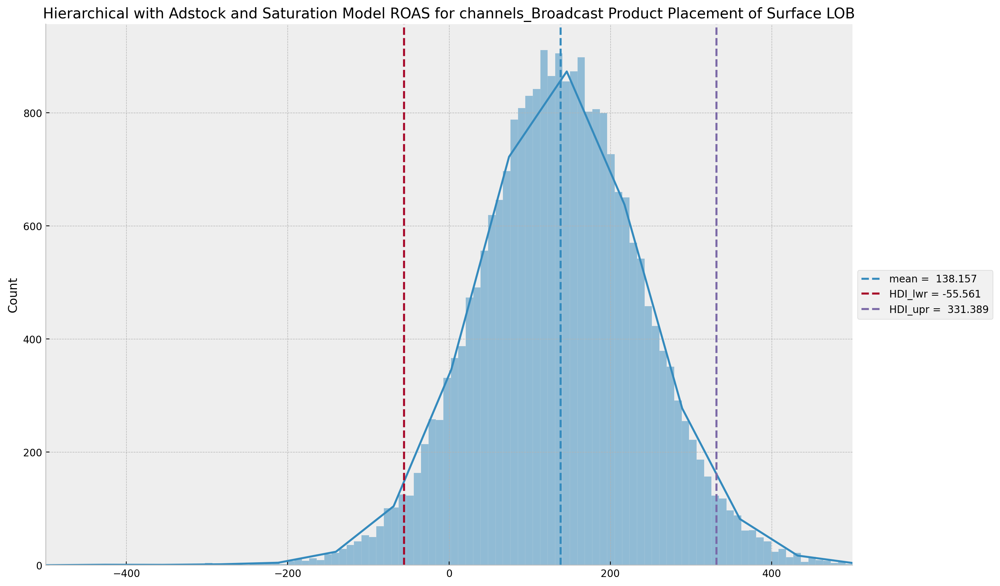

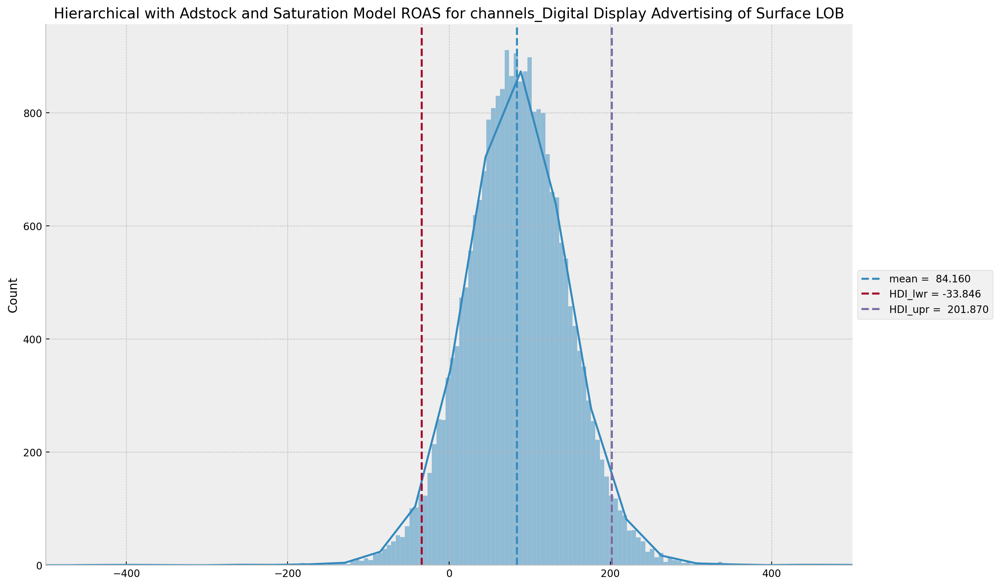

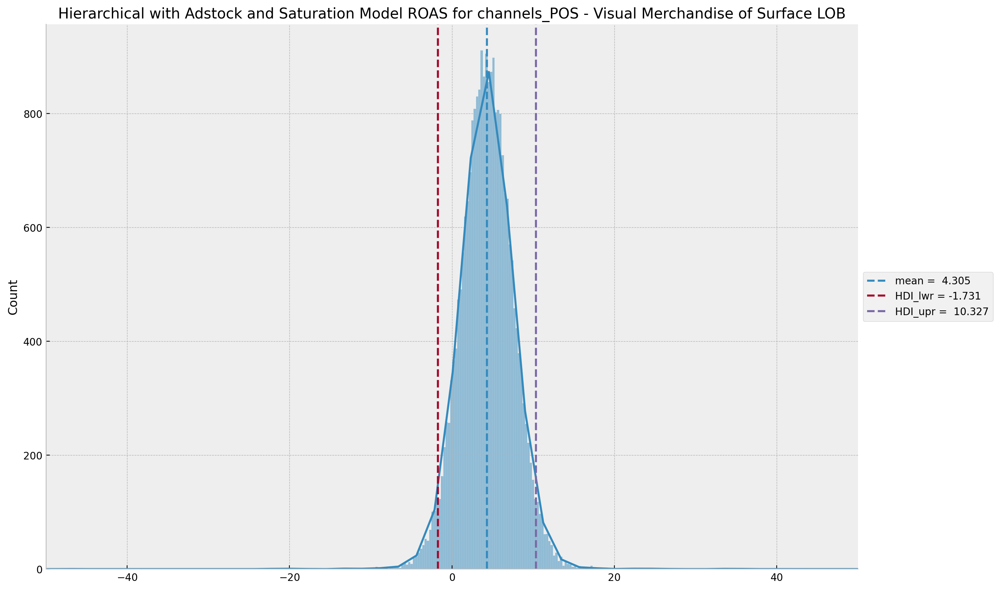

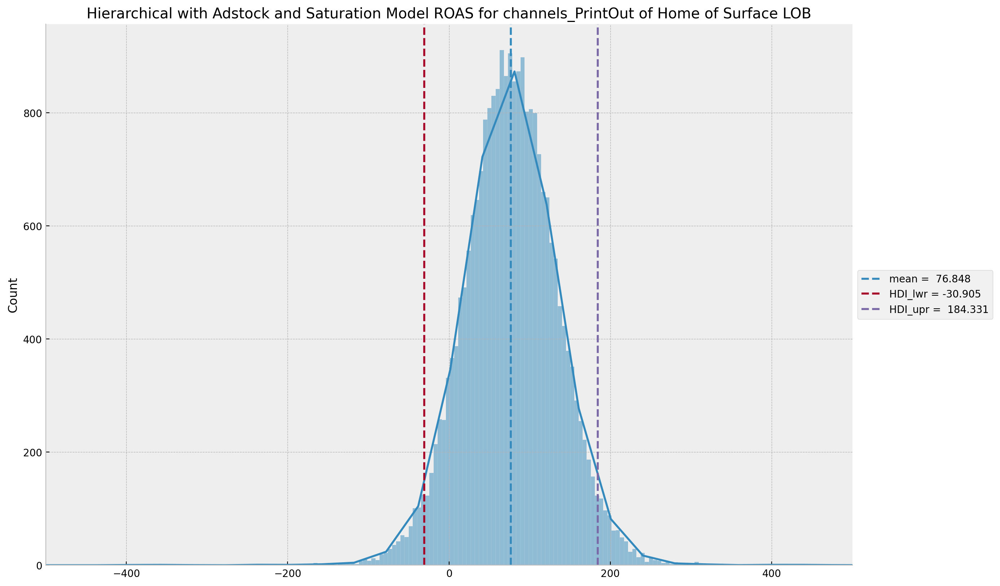

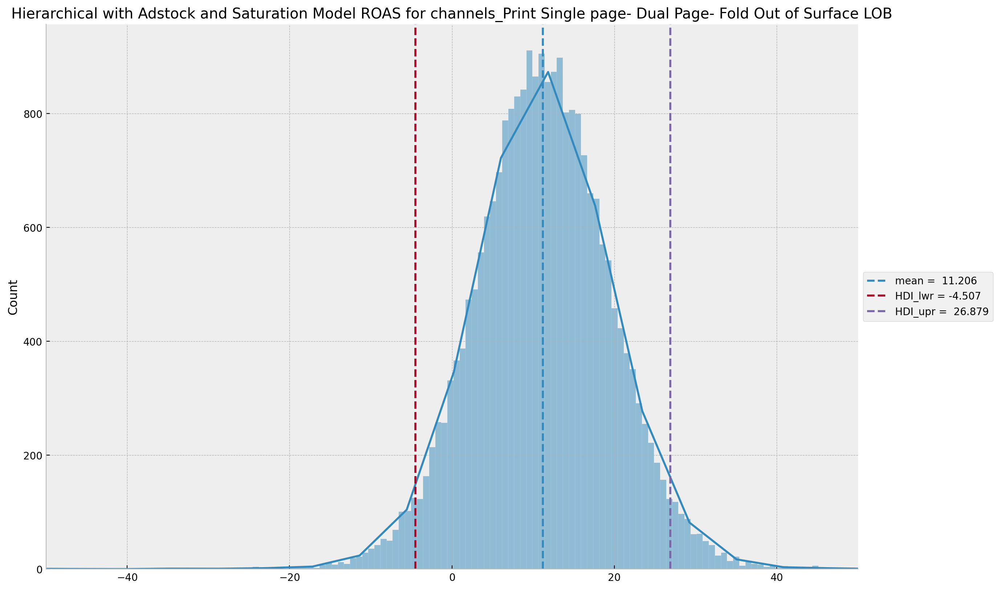

In [176]:
# Set the desired lower and upper bounds for the x-axis
lower_bound = -100.0  # Replace this with your desired lower bound
upper_bound = 100.0  # Replace this with your desired upper bound


# Create the plot
for num, channel_roas in enumerate(HierROAS_surface_channels): 
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [0, 1, 3]:
        plt.xlim(-500, 500)
    else:
        plt.xlim(-50, 50)

    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Hierarchical with Adstock and Saturation Model ROAS for channels_{channel_name} of Surface LOB");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()


c:\Users\raviteja.kurva\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


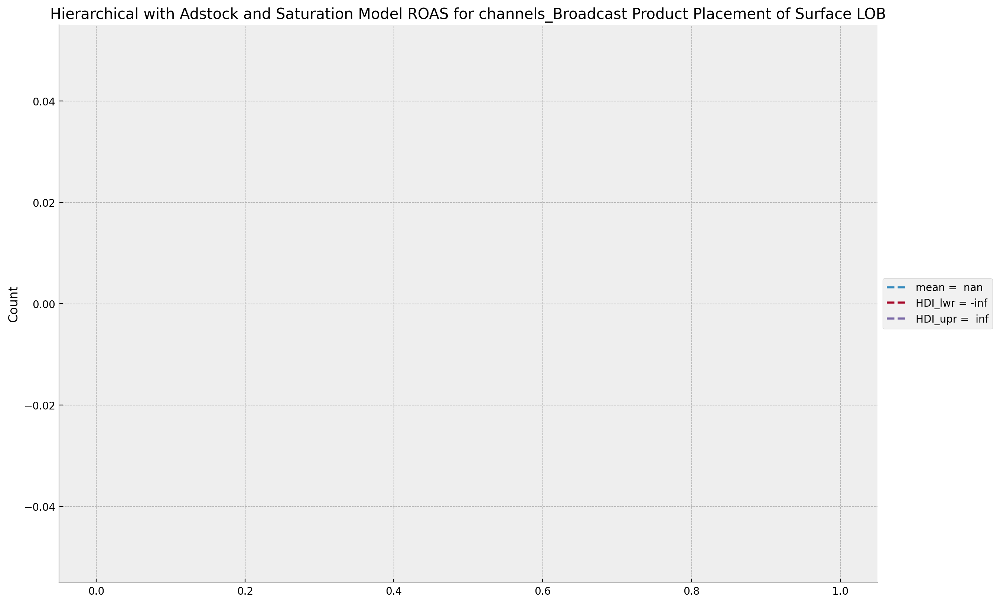

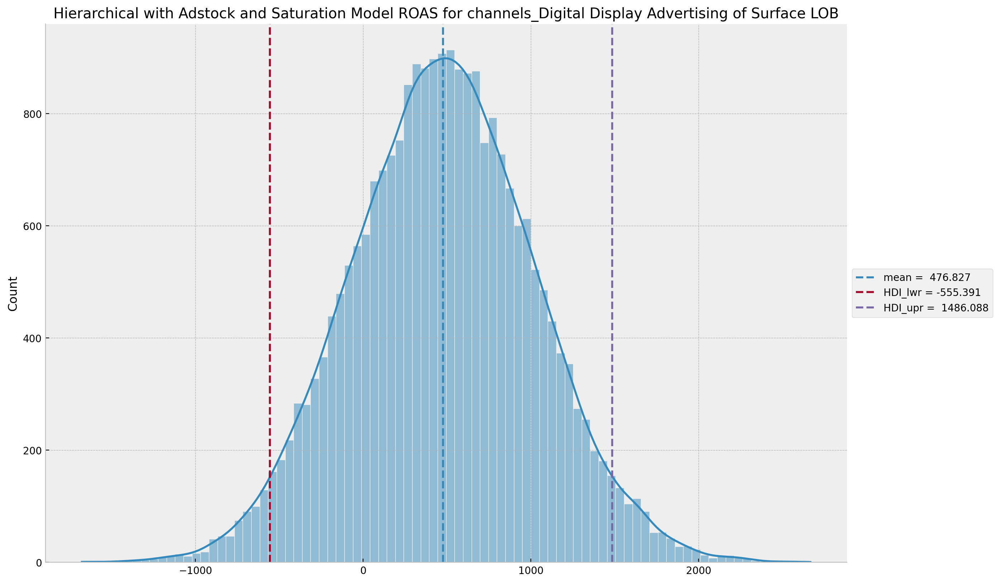

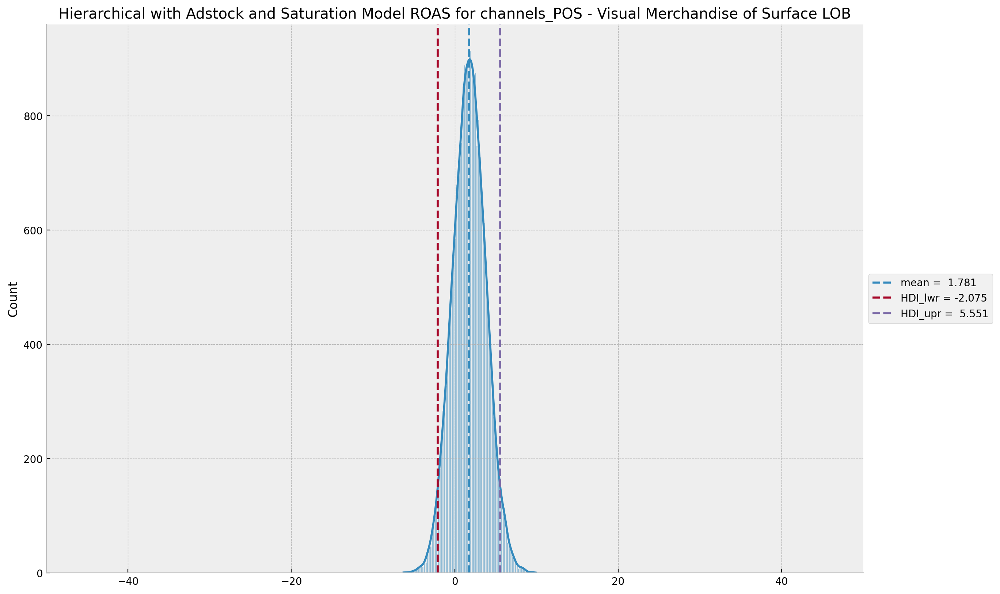

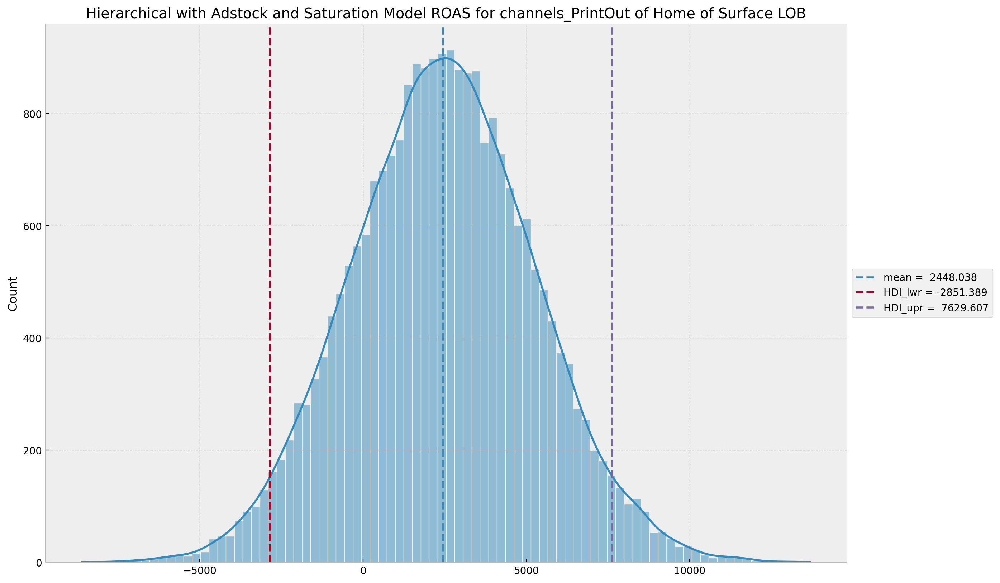

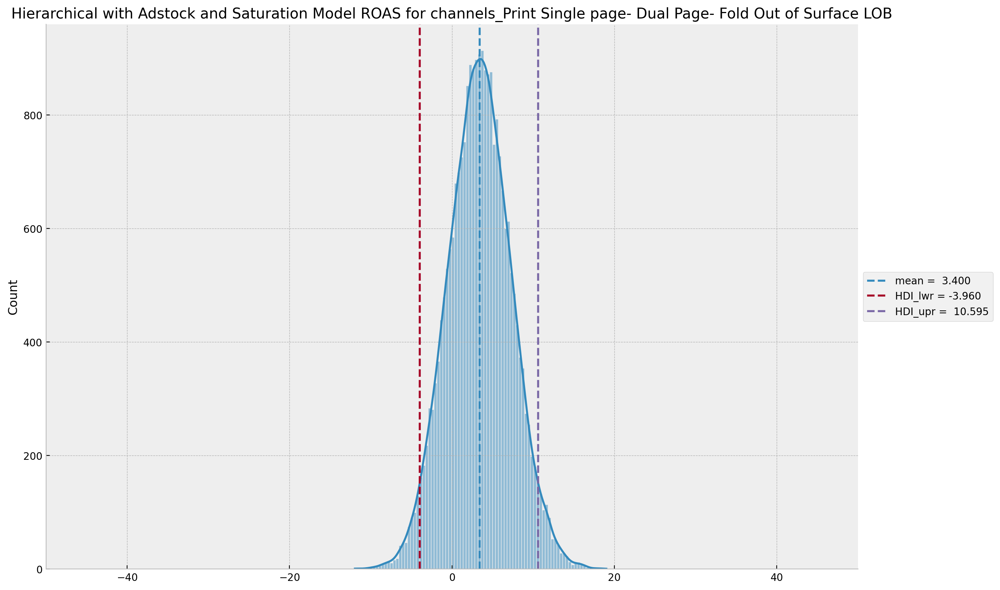

In [179]:
# Create the plot
for num, channel_roas in enumerate(HierROAS_office_channels): 
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [2, 4]:
        plt.xlim(-50, 50)


    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Hierarchical with Adstock and Saturation Model ROAS for channels_{channel_name} of Surface LOB");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()

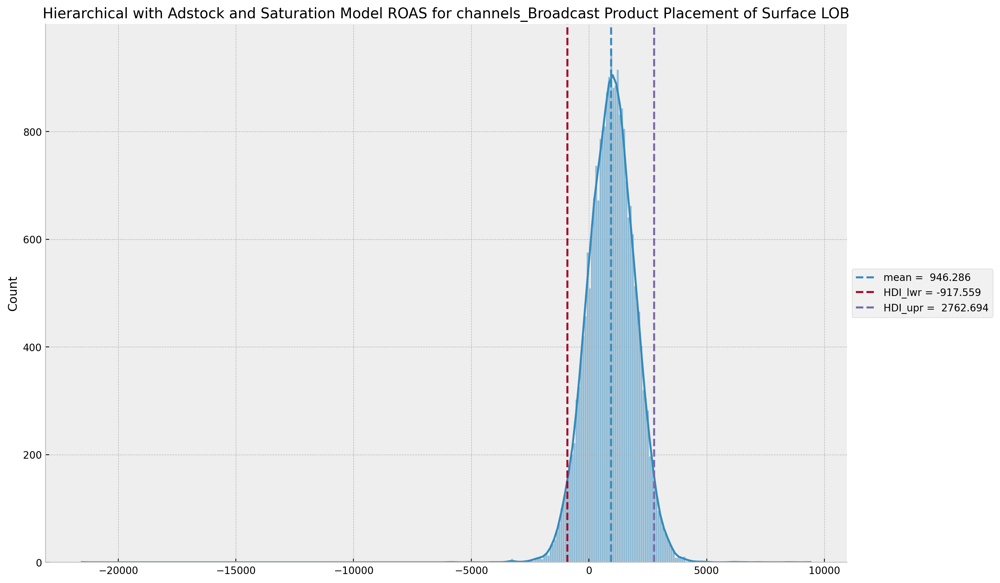

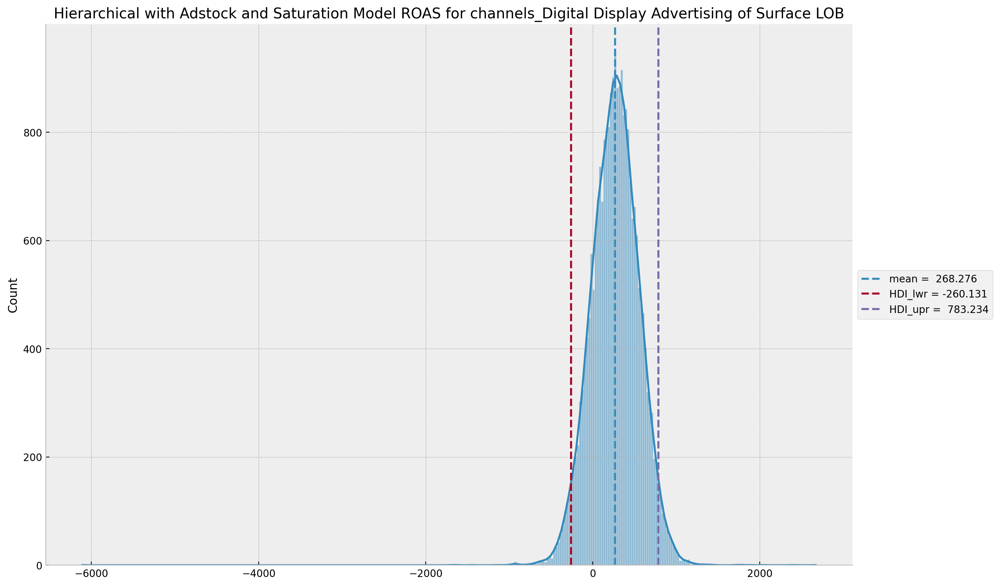

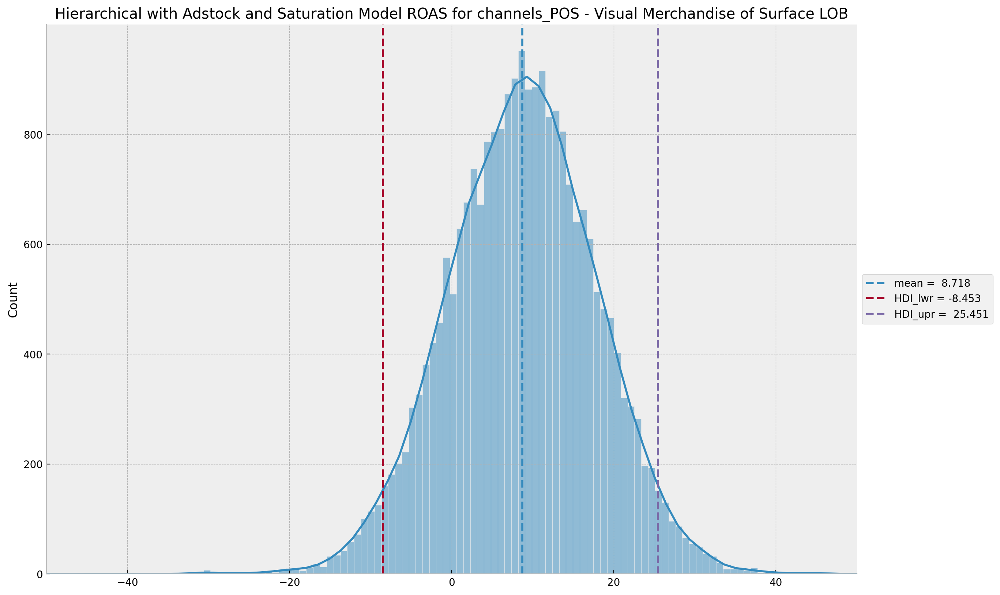

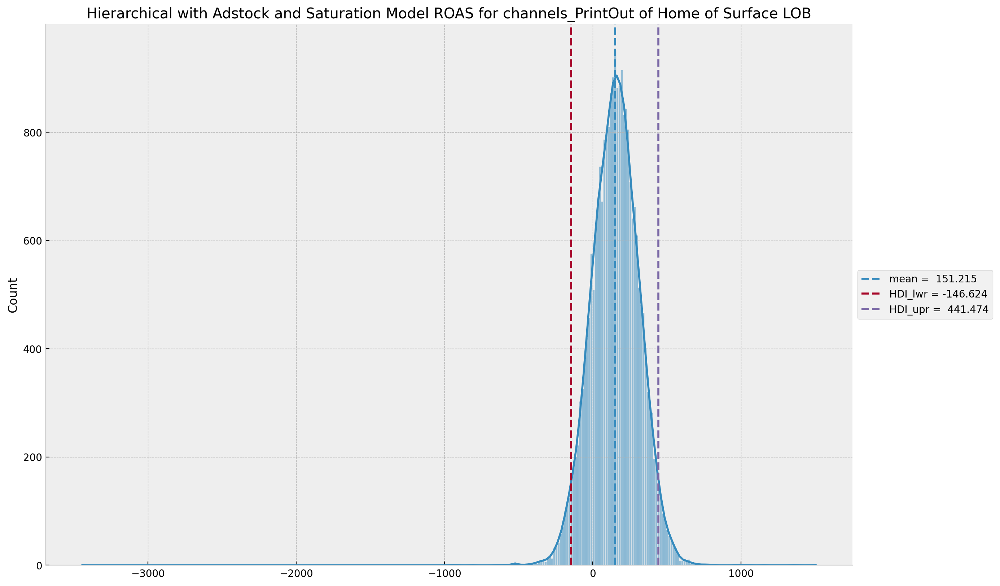

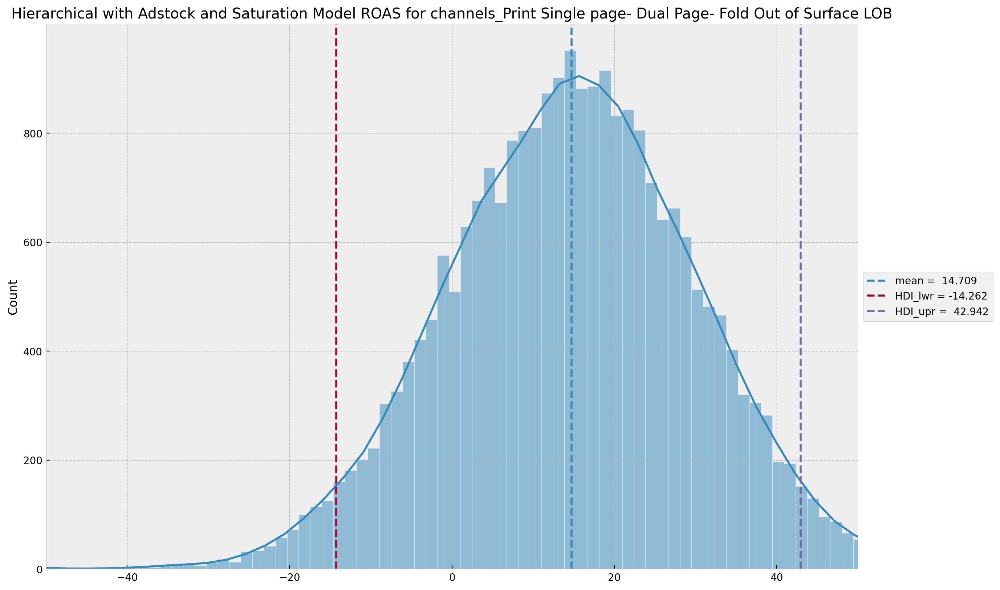

In [180]:
# Create the plot
for num, channel_roas in enumerate(HierROAS_Xbox_channels): 
    g = sns.displot(x=channel_roas, kde=True, height=8, aspect=1.5)
    ax = g.axes.flatten()[0]

    if num in [2, 4]:
        plt.xlim(-50, 50)


    channel_mean = np.mean(channel_roas)
    ax.axvline(
        x=np.mean(channel_roas), color="C0", linestyle="--", label=f"mean = {channel_mean: 0.3f}"
    )
    channel_hdi = az.hdi(ary=channel_roas)
    ax.axvline(
        x=channel_hdi[0],
        color="C1",
        linestyle="--",
        label=f"HDI_lwr = {channel_hdi[0]: 0.3f}",
    )
    ax.axvline(
        x=channel_hdi[1],
        color="C2",
        linestyle="--",
        label=f"HDI_upr = {channel_hdi[1]: 0.3f}",
    )
    channel_name = media_channles[num]
    ax.set(title=f"Hierarchical with Adstock and Saturation Model ROAS for channels_{channel_name} of Surface LOB");
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

In [ ]:
with pm.Model(coords=coords) as heriarchical_model:

    LOB_idx = pm.Data("LOB_idx", LOB, dims='Sales_Date')


    # Hyperpriors:
    a = pm.Normal("a", mu=0, sigma=4, shape=2)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    # Varying intercepts:
    a_intercept = pm.Normal(name="a_intercept", mu=a, sigma=sigma_a, dims='lob')

    ## gaussian random walk standard deviation
    sigma_slope = pm.HalfNormal(name="sigma_slope", sigma=0.05, shape=(3, 5))
    


    ## trend
    b_trend = pm.Normal(name="b_trend", mu=0, sigma=2)
    ## seasonality
    b_fourier = pm.Laplace(name="b_fourier", mu=0, b=2, dims="fourier_mode")



    ## standard deviation of the normal likelihood
    sigma = pm.HalfNormal(name="sigma", sigma=0.5, shape=3)
    # degrees of freedom of the t distribution
    nu = pm.Gamma(name="nu", alpha=10, beta=1, shape=3)


     # --- model parametrization ---
    trend = pm.Deterministic(name="trend", var=a_intercept + b_trend * t, dims="lob")
    seasonality = pm.Deterministic(
        name="seasonality", var=pm.math.dot(fourier_features, b_fourier), dims="lob"
    )
    slopes = pm.GaussianRandomWalk(
        name="slopes",
        sigma=b_slope,
        init_dist=pm.distributions.continuous.Normal.dist(
            name="init_dist", mu=0, sigma=2
        ),
        dims="lob",
    )


    # Expected value per county:
    mu = (a+ a_intercept[LOB_idx] * sigma_a) + (b + zb_county[county_idx] * sigma_b) * floor

    

#### Marketing Budget Optimization 

In [ ]:
# Identify the channels that are not continued in the future
continued_channels = ["Broadcast Product Placement", "Digital Display Advertising", "Print Single page- Dual Page- Fold Out"]

# Calculate the budget for each channel
budget = 10000
for channel in continued_channels:
    budget_for_channel = budget * trace["beta_" + channel].mean()

# Optimize the budget allocation
def objective(allocation):
    total_budget = sum(allocation)
    if total_budget > budget:
        return float("inf")
    return -sum(allocation * trace["beta_" + channel].mean() for channel in continued_channels)

allocation = pm.optimize.brute(objective, ranges=dict(allocation=list(range(0, budget + 1))))

# Print the results
print("Optimal budget allocation:")
for channel, amount in allocation.items():
    print(channel, amount)
